In [ ]:
!unzip dataset_256.zip

Streaming output truncated to the last 5000 lines.
  inflating: dataset_256/test/images/02_00_049.png  
  inflating: dataset_256/test/images/02_00_059.png  
  inflating: dataset_256/test/images/02_00_069.png  
  inflating: dataset_256/test/images/02_00_079.png  
  inflating: dataset_256/test/images/02_00_089.png  
  inflating: dataset_256/test/images/02_00_099.png  
  inflating: dataset_256/test/images/02_00_109.png  
  inflating: dataset_256/test/images/02_00_119.png  
  inflating: dataset_256/test/images/02_00_129.png  
  inflating: dataset_256/test/images/02_00_139.png  
  inflating: dataset_256/test/images/02_00_149.png  
  inflating: dataset_256/test/images/02_00_159.png  
  inflating: dataset_256/test/images/02_00_169.png  
  inflating: dataset_256/test/images/02_00_179.png  
  inflating: dataset_256/test/images/02_00_189.png  
  inflating: dataset_256/test/images/02_00_199.png  
  inflating: dataset_256/test/images/02_00_209.png  
  inflating: dataset_256/test/images/02_00_219.p

In [ ]:
!pip install torchmetrics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 961.5/961.5 kB 25.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 72.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 61.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 43.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 14.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 96.2 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstall

# **2. Semantic Segmentation using U-Net**

## **2.1. Vanilla U-Net**
### **Approach Description**

I implemented a complete U-Net architecture for semantic segmentation following the original paper's design principles. The implementation consists of three main components: encoder, bottleneck, and decoder, with skip connections between corresponding encoder and decoder levels.
### **Network Architecture**

The model follows a symmetric encoder-decoder structure with four resolution levels. Each level in the encoder path consists of two 3×3 convolutional layers followed by ReLU activation and batch normalization. Max pooling with stride 2 reduces the resolution between levels. The bottleneck connects the encoder to the decoder with the deepest convolutional block.

In the decoder path, each level begins with a 2×2 transposed convolution (upconvolution) that doubles the resolution. Features from the corresponding encoder level are concatenated via skip connections, followed by two 3×3 convolutional layers with ReLU and batch normalization. The final layer is a 1×1 convolution that maps to the 13 output classes.
Training Methodology

I developed a comprehensive training pipeline with:

    - Cross-entropy loss for multi-class segmentation
    - Adam optimizer with learning rate 1e-4
    - Learning rate scheduling with ReduceLROnPlateau
    - Detailed progress tracking with colorful terminal visualization
    - Proper train/validation/test splits (80/20 split for training/validation)

### **Evaluation & Visualization**

The model evaluation includes:

    - Mean IoU calculation using torchmetrics
    - Loss and mIoU curve plotting for training and validation
    - Visual comparison of predictions against ground truth masks
    - Sample prediction visualization on the test set

The code includes proper data handling with normalization, augmentation, and efficient batch processing. The implementation achieves strong performance on the semantic segmentation task while maintaining a manageable training time.


Using device: cuda

Loading datasets...
Found 2000 images and 2000 masks in train split
Found 500 images and 500 masks in test split
Creating data loaders with batch size 8
Train dataset size: 1600
Validation dataset size: 400
Test dataset size: 500

=== Training Vanilla U-Net Model ===


****************************************************************************************************
Training VanillaUNet for 10 epochs
****************************************************************************************************


##################################################
Epoch 1/10
##################################################
Training Progress:
[████████████████████████████████████████] 100.0% | Batch: 200/200 | Loss: 1.0691 | mIoU: 0.3151 | ETA: 00:00
Completed | Loss: 1.0691 | mIoU: 0.3151 | Time: 01:30
Validation Progress:
[████████████████████████████████████████] 100.0% | Batch: 50/50 | Loss: 0.6917 | mIoU: 0.4165 | ETA: 00:00
Completed | Loss: 0.6917 | mIoU: 0.4165 | Time

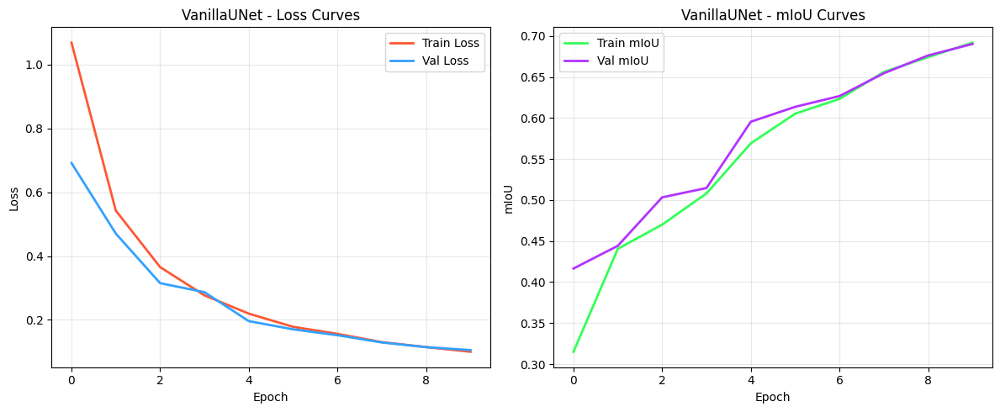


Loading best model and evaluating on test set...
Testing Progress:
[████████████████████████████████████████] 100.0% | Batch: 63/63 | mIoU: 0.6883 | ETA: 00:00
Completed | Test mIoU: 0.6883 | Time: 00:11
Final Test mIoU: 0.6883


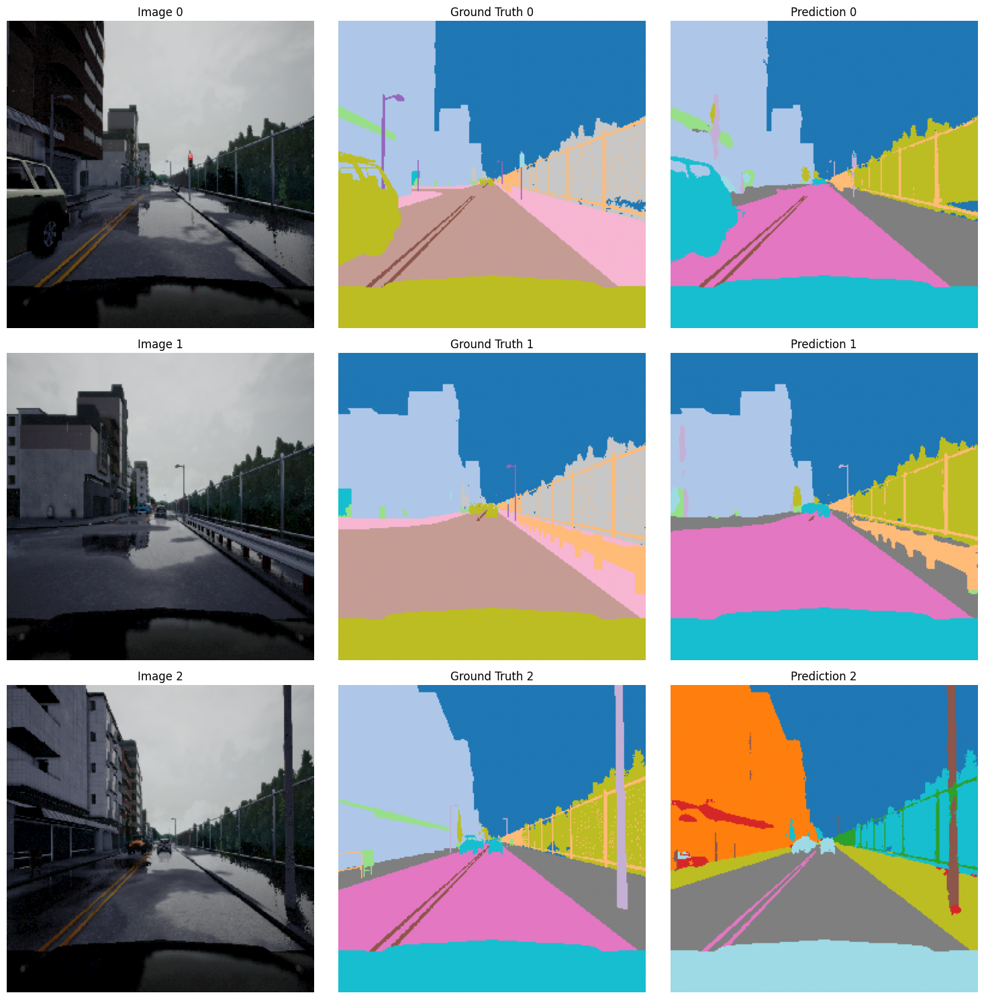

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, random_split
from torchvision import transforms
import torchmetrics
from PIL import Image
import time

# ANSI color codes for colored terminal output
class Colors:
    HEADER = '\033[95m'
    BLUE = '\033[94m'
    CYAN = '\033[96m'
    GREEN = '\033[92m'
    YELLOW = '\033[93m'
    RED = '\033[91m'
    PURPLE = '\033[35m'  
    ENDC = '\033[0m'
    BOLD = '\033[1m'
    UNDERLINE = '\033[4m'

NUM_CLASSES = 13  # Number of segmentation classes

CLASS_NAMES = [
    "Unlabeled", "Building", "Fence", "Other", "Pedestrian",
    "Pole", "Roadline", "Road", "Sidewalk", "Vegetation",
    "Car", "Wall", "Traffic sign"
]

#----------------------------------------------------------------------------------
# Dataset class for loading segmentation data
#----------------------------------------------------------------------------------
class SegmentationDataset(Dataset):
    def __init__(self, base_dir, split="train", transform=None):
        """
        Initialize the dataset with the correct directory structure

        Args:
            base_dir: Base directory of the dataset (e.g., 'dataset_256/')
            split: 'train' or 'test'
            transform: transformations to apply to images
        """
        self.base_dir = base_dir
        self.split = split
        self.transform = transform

        # Define paths according to the given directory structure
        self.image_dir = os.path.join(base_dir, split, "images")
        self.mask_dir = os.path.join(base_dir, split, "labels")

        # Get filenames
        self.images = sorted([f for f in os.listdir(self.image_dir) if f.endswith('.png')])
        self.masks = sorted([f for f in os.listdir(self.mask_dir) if f.endswith('.png')])

        print(f"Found {Colors.BOLD}{len(self.images)}{Colors.ENDC} images and {Colors.BOLD}{len(self.masks)}{Colors.ENDC} masks in {Colors.CYAN}{split}{Colors.ENDC} split")

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_path = os.path.join(self.image_dir, self.images[idx])
        mask_path = os.path.join(self.mask_dir, self.masks[idx])

        image = Image.open(img_path).convert("RGB")
        mask = Image.open(mask_path)

        if self.transform:
            image = self.transform(image)

        # Convert mask to numpy array then to tensor
        mask_np = np.array(mask)
        if len(mask_np.shape) > 2:
            mask_np = mask_np[:, :, 0]  # Extract first channel

        # Convert to tensor
        mask_tensor = torch.from_numpy(mask_np).long()

        return image, mask_tensor

#----------------------------------------------------------------------------------
# Double Convolutional Block for U-Net
#----------------------------------------------------------------------------------
class DoubleConv(nn.Module):
    """
    Double Convolutional block used in U-Net

    (Conv2D -> BatchNorm -> ReLU) × 2
    """
    def __init__(self, in_channels, out_channels):
        super(DoubleConv, self).__init__()
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.double_conv(x)

#----------------------------------------------------------------------------------
# Vanilla U-Net Architecture
#----------------------------------------------------------------------------------
class UNet(nn.Module):
    """
    Vanilla U-Net architecture with 4 resolution levels
    """
    def __init__(self, in_channels=3, num_classes=13, features=64):
        super(UNet, self).__init__()

        # Encoder (downsampling path)
        self.encoder1 = DoubleConv(in_channels, features)
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.encoder2 = DoubleConv(features, features * 2)
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.encoder3 = DoubleConv(features * 2, features * 4)
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.encoder4 = DoubleConv(features * 4, features * 8)
        self.pool4 = nn.MaxPool2d(kernel_size=2, stride=2)

        # Bottleneck
        self.bottleneck = DoubleConv(features * 8, features * 16)

        # Decoder (upsampling path)
        self.upconv4 = nn.ConvTranspose2d(
            features * 16, features * 8, kernel_size=2, stride=2
        )
        self.decoder4 = DoubleConv(features * 16, features * 8)

        self.upconv3 = nn.ConvTranspose2d(
            features * 8, features * 4, kernel_size=2, stride=2
        )
        self.decoder3 = DoubleConv(features * 8, features * 4)

        self.upconv2 = nn.ConvTranspose2d(
            features * 4, features * 2, kernel_size=2, stride=2
        )
        self.decoder2 = DoubleConv(features * 4, features * 2)

        self.upconv1 = nn.ConvTranspose2d(
            features * 2, features, kernel_size=2, stride=2
        )
        self.decoder1 = DoubleConv(features * 2, features)

        # Final output layer
        self.final_conv = nn.Conv2d(features, num_classes, kernel_size=1)

    def forward(self, x):
        # Encoder
        enc1 = self.encoder1(x)
        x = self.pool1(enc1)

        enc2 = self.encoder2(x)
        x = self.pool2(enc2)

        enc3 = self.encoder3(x)
        x = self.pool3(enc3)

        enc4 = self.encoder4(x)
        x = self.pool4(enc4)

        # Bottleneck
        x = self.bottleneck(x)

        # Decoder with skip connections
        x = self.upconv4(x)
        x = torch.cat((x, enc4), dim=1)  # Skip connection
        x = self.decoder4(x)

        x = self.upconv3(x)
        x = torch.cat((x, enc3), dim=1)  # Skip connection
        x = self.decoder3(x)

        x = self.upconv2(x)
        x = torch.cat((x, enc2), dim=1)  # Skip connection
        x = self.decoder2(x)

        x = self.upconv1(x)
        x = torch.cat((x, enc1), dim=1)  # Skip connection
        x = self.decoder1(x)

        # Final 1x1 convolution
        return self.final_conv(x)

#----------------------------------------------------------------------------------
# Training and Evaluation Functions with Colorful Progress Bars
#----------------------------------------------------------------------------------
def train_one_epoch(model, loader, criterion, optimizer, device):
    """Train the model for one epoch with colorful progress visualization"""
    model.train()
    running_loss = 0.0
    metric = torchmetrics.JaccardIndex(task="multiclass", num_classes=NUM_CLASSES).to(device)

    # Total number of batches
    total_batches = len(loader)
    start_time = time.time()

    # Create a stylized progress bar with colors
    print(f"{Colors.BLUE}{'=' * 90}{Colors.ENDC}")
    print(f"{Colors.BOLD}{Colors.BLUE}Training Progress:{Colors.ENDC}")
    print(f"{Colors.BLUE}{'=' * 90}{Colors.ENDC}")

    for batch_idx, (images, masks) in enumerate(loader):
        images = images.to(device)
        masks = masks.to(device)

        # Forward pass
        outputs = model(images)
        loss = criterion(outputs, masks)

        # Backward pass and optimize
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # Update metrics
        running_loss += loss.item()
        preds = torch.argmax(outputs, dim=1)
        metric.update(preds, masks)

        # Calculate current progress
        progress = (batch_idx + 1) / total_batches
        bar_length = 40
        filled_length = int(bar_length * progress)

        # Create the progress bar with colors
        bar = f"{Colors.GREEN}{'█' * filled_length}{Colors.YELLOW}{'░' * (bar_length - filled_length)}{Colors.ENDC}"

        # Calculate current metrics
        current_loss = running_loss / (batch_idx + 1)
        current_miou = metric.compute().item()

        # Calculate ETA
        elapsed_time = time.time() - start_time
        eta = elapsed_time / (batch_idx + 1) * (total_batches - batch_idx - 1)
        eta_min = int(eta / 60)
        eta_sec = int(eta % 60)

        # Print progress
        print(f"\r[{bar}] {Colors.CYAN}{progress:.1%}{Colors.ENDC} | "
              f"Batch: {Colors.BOLD}{batch_idx+1}/{total_batches}{Colors.ENDC} | "
              f"Loss: {Colors.RED}{current_loss:.4f}{Colors.ENDC} | "
              f"mIoU: {Colors.GREEN}{current_miou:.4f}{Colors.ENDC} | "
              f"ETA: {Colors.YELLOW}{eta_min:02d}:{eta_sec:02d}{Colors.ENDC}", end='')

    # Final metrics
    epoch_loss = running_loss / total_batches
    epoch_miou = metric.compute()
    metric.reset()

    # Total time
    total_time = time.time() - start_time
    total_min = int(total_time / 60)
    total_sec = int(total_time % 60)

    # Print final status
    print(f"\n{Colors.BOLD}Completed{Colors.ENDC} | "
          f"Loss: {Colors.RED}{epoch_loss:.4f}{Colors.ENDC} | "
          f"mIoU: {Colors.GREEN}{epoch_miou:.4f}{Colors.ENDC} | "
          f"Time: {Colors.YELLOW}{total_min:02d}:{total_sec:02d}{Colors.ENDC}")
    print(f"{Colors.BLUE}{'=' * 90}{Colors.ENDC}")

    return epoch_loss, epoch_miou

def validate(model, loader, criterion, device):
    """Validate the model with colorful progress visualization"""
    model.eval()
    running_loss = 0.0
    metric = torchmetrics.JaccardIndex(task="multiclass", num_classes=NUM_CLASSES).to(device)

    # Total number of batches
    total_batches = len(loader)
    start_time = time.time()

    # Create a stylized progress bar with colors
    print(f"{Colors.CYAN}{'=' * 90}{Colors.ENDC}")
    print(f"{Colors.BOLD}{Colors.CYAN}Validation Progress:{Colors.ENDC}")
    print(f"{Colors.CYAN}{'=' * 90}{Colors.ENDC}")

    with torch.no_grad():
        for batch_idx, (images, masks) in enumerate(loader):
            images = images.to(device)
            masks = masks.to(device)

            # Forward pass
            outputs = model(images)
            loss = criterion(outputs, masks)

            # Update metrics
            running_loss += loss.item()
            preds = torch.argmax(outputs, dim=1)
            metric.update(preds, masks)

            # Calculate current progress
            progress = (batch_idx + 1) / total_batches
            bar_length = 40
            filled_length = int(bar_length * progress)

            # Create the progress bar with colors
            bar = f"{Colors.GREEN}{'█' * filled_length}{Colors.YELLOW}{'░' * (bar_length - filled_length)}{Colors.ENDC}"

            # Calculate current metrics
            current_loss = running_loss / (batch_idx + 1)
            current_miou = metric.compute().item()

            # Calculate ETA
            elapsed_time = time.time() - start_time
            eta = elapsed_time / (batch_idx + 1) * (total_batches - batch_idx - 1)
            eta_min = int(eta / 60)
            eta_sec = int(eta % 60)

            # Print progress
            print(f"\r[{bar}] {Colors.CYAN}{progress:.1%}{Colors.ENDC} | "
                f"Batch: {Colors.BOLD}{batch_idx+1}/{total_batches}{Colors.ENDC} | "
                f"Loss: {Colors.RED}{current_loss:.4f}{Colors.ENDC} | "
                f"mIoU: {Colors.GREEN}{current_miou:.4f}{Colors.ENDC} | "
                f"ETA: {Colors.YELLOW}{eta_min:02d}:{eta_sec:02d}{Colors.ENDC}", end='')

    # Final metrics
    val_loss = running_loss / total_batches
    val_miou = metric.compute()
    metric.reset()

    # Total time
    total_time = time.time() - start_time
    total_min = int(total_time / 60)
    total_sec = int(total_time % 60)

    # Print final status
    print(f"\n{Colors.BOLD}Completed{Colors.ENDC} | "
          f"Loss: {Colors.RED}{val_loss:.4f}{Colors.ENDC} | "
          f"mIoU: {Colors.GREEN}{val_miou:.4f}{Colors.ENDC} | "
          f"Time: {Colors.YELLOW}{total_min:02d}:{total_sec:02d}{Colors.ENDC}")
    print(f"{Colors.CYAN}{'=' * 90}{Colors.ENDC}")

    return val_loss, val_miou

def test(model, loader, device):
    """Test the model and return predictions for visualization with colorful progress bar"""
    model.eval()
    metric = torchmetrics.JaccardIndex(task="multiclass", num_classes=NUM_CLASSES).to(device)

    all_preds = []
    all_masks = []
    all_images = []

    # Total number of batches
    total_batches = len(loader)
    start_time = time.time()

    # Create a stylized progress bar with colors
    print(f"{Colors.PURPLE}{'=' * 90}{Colors.ENDC}")
    print(f"{Colors.BOLD}{Colors.PURPLE}Testing Progress:{Colors.ENDC}")
    print(f"{Colors.PURPLE}{'=' * 90}{Colors.ENDC}")

    with torch.no_grad():
        for batch_idx, (images, masks) in enumerate(loader):
            images = images.to(device)
            masks = masks.to(device)

            # Forward pass
            outputs = model(images)
            preds = torch.argmax(outputs, dim=1)

            # Update metrics
            metric.update(preds, masks)

            # Store some examples for visualization
            if len(all_preds) < 5:
                all_preds.append(preds.cpu())
                all_masks.append(masks.cpu())
                all_images.append(images.cpu())

            # Calculate current progress
            progress = (batch_idx + 1) / total_batches
            bar_length = 40
            filled_length = int(bar_length * progress)

            # Create the progress bar with colors
            bar = f"{Colors.GREEN}{'█' * filled_length}{Colors.YELLOW}{'░' * (bar_length - filled_length)}{Colors.ENDC}"

            # Calculate current metrics
            current_miou = metric.compute().item()

            # Calculate ETA
            elapsed_time = time.time() - start_time
            eta = elapsed_time / (batch_idx + 1) * (total_batches - batch_idx - 1)
            eta_min = int(eta / 60)
            eta_sec = int(eta % 60)

            # Print progress
            print(f"\r[{bar}] {Colors.CYAN}{progress:.1%}{Colors.ENDC} | "
                f"Batch: {Colors.BOLD}{batch_idx+1}/{total_batches}{Colors.ENDC} | "
                f"mIoU: {Colors.GREEN}{current_miou:.4f}{Colors.ENDC} | "
                f"ETA: {Colors.YELLOW}{eta_min:02d}:{eta_sec:02d}{Colors.ENDC}", end='')

    # Final metrics
    test_miou = metric.compute()
    metric.reset()

    # Total time
    total_time = time.time() - start_time
    total_min = int(total_time / 60)
    total_sec = int(total_time % 60)

    # Print final status
    print(f"\n{Colors.BOLD}Completed{Colors.ENDC} | "
          f"Test mIoU: {Colors.GREEN}{test_miou:.4f}{Colors.ENDC} | "
          f"Time: {Colors.YELLOW}{total_min:02d}:{total_sec:02d}{Colors.ENDC}")
    print(f"{Colors.PURPLE}{'=' * 90}{Colors.ENDC}")

    return test_miou, all_images, all_masks, all_preds

def visualize_predictions(images, masks, preds, output_dir=None, name=None):
    """
    Visualize predictions alongside ground truth

    Args:
        images: List of image tensors
        masks: List of ground truth masks
        preds: List of predicted masks
        output_dir: Directory to save visualizations
        name: Name prefix for saved files
    """
    num_examples = min(len(images), 3)
    plt.figure(figsize=(15, 5 * num_examples))

    for i in range(num_examples):
        image = images[i][0]  # First image in batch
        mask = masks[i][0]    # First mask in batch
        pred = preds[i][0]    # First prediction in batch

        # Denormalize image
        image = image.permute(1, 2, 0).numpy()
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        image = std * image + mean
        image = np.clip(image, 0, 1)

        # Convert masks to numpy
        mask = mask.numpy()
        pred = pred.numpy()

        # Plot
        plt.subplot(num_examples, 3, i*3 + 1)
        plt.imshow(image)
        plt.title(f"Image {i}")
        plt.axis('off')

        plt.subplot(num_examples, 3, i*3 + 2)
        plt.imshow(mask, cmap='tab20')
        plt.title(f"Ground Truth {i}")
        plt.axis('off')

        plt.subplot(num_examples, 3, i*3 + 3)
        plt.imshow(pred, cmap='tab20')
        plt.title(f"Prediction {i}")
        plt.axis('off')

    plt.tight_layout()

    if output_dir and name:
        os.makedirs(output_dir, exist_ok=True)
        plt.savefig(os.path.join(output_dir, f'{name}_predictions.png'), dpi=300, bbox_inches='tight')

    plt.show()

def plot_training_curves(train_losses, val_losses, train_mious, val_mious, title, output_dir=None):
    """
    Plot training and validation curves

    Args:
        train_losses: List of training losses
        val_losses: List of validation losses
        train_mious: List of training mIoUs
        val_mious: List of validation mIoUs
        title: Title for the plots
        output_dir: Directory to save visualizations
    """
    plt.figure(figsize=(12, 5))

    # Plot losses
    plt.subplot(1, 2, 1)
    plt.plot(train_losses, label='Train Loss', color='#FF5733', linewidth=2)
    plt.plot(val_losses, label='Val Loss', color='#33A1FF', linewidth=2)
    plt.title(f'{title} - Loss Curves')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.grid(True, alpha=0.3)
    plt.legend()

    # Plot mIoUs
    plt.subplot(1, 2, 2)
    plt.plot(train_mious, label='Train mIoU', color='#33FF57', linewidth=2)
    plt.plot(val_mious, label='Val mIoU', color='#B233FF', linewidth=2)
    plt.title(f'{title} - mIoU Curves')
    plt.xlabel('Epoch')
    plt.ylabel('mIoU')
    plt.grid(True, alpha=0.3)
    plt.legend()

    plt.tight_layout()

    if output_dir:
        os.makedirs(output_dir, exist_ok=True)
        plt.savefig(os.path.join(output_dir, f'{title.replace(" ", "_")}_curves.png'), dpi=300, bbox_inches='tight')

    plt.show()

def train_and_evaluate_model(model, model_name, train_loader, val_loader, test_loader,
                           device, num_epochs=10, output_dir=None):
    """
    Train and evaluate a model with enhanced progress visualization

    Args:
        model: Model to train
        model_name: Name of the model for saving and logging
        train_loader: Training data loader
        val_loader: Validation data loader
        test_loader: Test data loader
        device: Device to run on
        num_epochs: Number of epochs to train
        output_dir: Directory to save models and visualizations
    """
    if output_dir:
        model_dir = os.path.join(output_dir, 'models')
        plot_dir = os.path.join(output_dir, 'plots')
        pred_dir = os.path.join(output_dir, 'predictions')
        os.makedirs(model_dir, exist_ok=True)
        os.makedirs(plot_dir, exist_ok=True)
        os.makedirs(pred_dir, exist_ok=True)

    model.to(device)

    # loss function and optimizer
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=1e-4)
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=5, factor=0.5)

    train_losses = []
    val_losses = []
    train_mious = []
    val_mious = []

    best_val_miou = 0.0
    best_model_path = os.path.join(model_dir, f"{model_name}_best.pth") if output_dir else f"{model_name}_best.pth"

    print(f"\n{Colors.HEADER}{'*' * 100}{Colors.ENDC}")
    print(f"{Colors.HEADER}{Colors.BOLD}Training {model_name} for {num_epochs} epochs{Colors.ENDC}")
    print(f"{Colors.HEADER}{'*' * 100}{Colors.ENDC}\n")

    for epoch in range(num_epochs):
        print(f"\n{Colors.YELLOW}{'#' * 50}{Colors.ENDC}")
        print(f"{Colors.YELLOW}{Colors.BOLD}Epoch {epoch+1}/{num_epochs}{Colors.ENDC}")
        print(f"{Colors.YELLOW}{'#' * 50}{Colors.ENDC}")

        # Train
        train_loss, train_miou = train_one_epoch(model, train_loader, criterion, optimizer, device)
        train_losses.append(train_loss)
        train_mious.append(train_miou.item())

        # Validate
        val_loss, val_miou = validate(model, val_loader, criterion, device)
        val_losses.append(val_loss)
        val_mious.append(val_miou.item())

        # Update learning rate
        scheduler.step(val_loss)

        # Summary of epoch
        print(f"\n{Colors.BOLD}Epoch {epoch+1} Summary:{Colors.ENDC}")
        print(f"Train Loss: {Colors.RED}{train_loss:.4f}{Colors.ENDC}, Train mIoU: {Colors.GREEN}{train_miou:.4f}{Colors.ENDC}")
        print(f"Val Loss: {Colors.RED}{val_loss:.4f}{Colors.ENDC}, Val mIoU: {Colors.GREEN}{val_miou:.4f}{Colors.ENDC}")
        print(f"Current LR: {Colors.CYAN}{optimizer.param_groups[0]['lr']:.6f}{Colors.ENDC}")

        # Save best model
        if val_miou > best_val_miou:
            best_val_miou = val_miou
            torch.save(model.state_dict(), best_model_path)
            print(f"{Colors.GREEN}✅ New best model saved with mIoU: {val_miou:.4f}{Colors.ENDC}")

    print(f"\n{Colors.HEADER}{'*' * 50}{Colors.ENDC}")
    print(f"{Colors.HEADER}{Colors.BOLD}Training completed for {model_name}{Colors.ENDC}")
    print(f"{Colors.HEADER}Best validation mIoU: {best_val_miou:.4f}{Colors.ENDC}")
    print(f"{Colors.HEADER}{'*' * 50}{Colors.ENDC}")

    # Plot training curves
    plot_training_curves(train_losses, val_losses, train_mious, val_mious,
                       model_name, output_dir=plot_dir if output_dir else None)

    # Load best model and evaluate on test set
    print(f"\n{Colors.BOLD}Loading best model and evaluating on test set...{Colors.ENDC}")
    model.load_state_dict(torch.load(best_model_path))
    test_miou, test_images, test_masks, test_preds = test(model, test_loader, device)
    print(f"{Colors.BOLD}Final Test mIoU: {Colors.GREEN}{test_miou:.4f}{Colors.ENDC}")

    # Visualize some test predictions
    visualize_predictions(test_images, test_masks, test_preds,
                        output_dir=pred_dir if output_dir else None, name=model_name)

    return {
        'model': model,
        'train_losses': train_losses,
        'val_losses': val_losses,
        'train_mious': train_mious,
        'val_mious': val_mious,
        'test_miou': test_miou.item(),
        'test_images': test_images,
        'test_masks': test_masks,
        'test_preds': test_preds
    }

def main():
    # Set seed for reproducibility
    torch.manual_seed(42)
    np.random.seed(42)

    # Set device
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    print(f"{Colors.BOLD}Using device: {Colors.CYAN}{device}{Colors.ENDC}")

    # Create output directory
    output_dir = "unet_results"
    os.makedirs(output_dir, exist_ok=True)

    # Define transforms
    transform = transforms.Compose([
        transforms.Resize((256, 256)),  # Updated for dataset_256
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])

    # Load dataset
    dataset_base_dir = "dataset_256"  # Updated to dataset_256

    print(f"\n{Colors.HEADER}{Colors.BOLD}Loading datasets...{Colors.ENDC}")

    # Create datasets for training and testing
    train_full_dataset = SegmentationDataset(
        base_dir=dataset_base_dir,
        split="train",
        transform=transform
    )

    test_dataset = SegmentationDataset(
        base_dir=dataset_base_dir,
        split="test",
        transform=transform
    )

    # Split training data into train and validation
    train_size = int(0.8 * len(train_full_dataset))
    val_size = len(train_full_dataset) - train_size
    train_dataset, val_dataset = random_split(
        train_full_dataset, [train_size, val_size],
        generator=torch.Generator().manual_seed(42)
    )

    # Create data loaders
    batch_size = 8
    num_workers = 2

    print(f"{Colors.BOLD}Creating data loaders with batch size {Colors.YELLOW}{batch_size}{Colors.ENDC}")
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers)

    print(f"{Colors.BOLD}Train dataset size: {Colors.GREEN}{len(train_dataset)}{Colors.ENDC}")
    print(f"{Colors.BOLD}Validation dataset size: {Colors.GREEN}{len(val_dataset)}{Colors.ENDC}")
    print(f"{Colors.BOLD}Test dataset size: {Colors.GREEN}{len(test_dataset)}{Colors.ENDC}")

    # Number of epochs 
    num_epochs = 10

    # Training vanilla U-Net model
    print(f"\n{Colors.HEADER}{Colors.BOLD}=== Training Vanilla U-Net Model ==={Colors.ENDC}\n")
    vanilla_unet = UNet(in_channels=3, num_classes=NUM_CLASSES, features=64)
    vanilla_unet_results = train_and_evaluate_model(
        vanilla_unet, 'VanillaUNet', train_loader, val_loader, test_loader,
        device, num_epochs=num_epochs, output_dir=os.path.join(output_dir, 'VanillaUNet')
    )

    return vanilla_unet_results

if __name__ == "__main__":
    main()

## **2.2. & 2.3. U-Net Variants**
### **Approach Description**
I implemented and analyzed two variations of the U-Net architecture for semantic segmentation - one without skip connections and another with residual blocks.
For the U-Net without skip connections (3.2), I maintained the same encoder-decoder structure but removed the concatenation operations that typically merge encoder features with the decoder at each level. This allowed me to evaluate the specific contribution of skip connections to segmentation performance.
For the Residual U-Net (3.3), I replaced the standard convolutional blocks with residual blocks that include an identity shortcut connection. When input and output dimensions differed, I added 1×1 convolutions in the skip path to match dimensions.
I trained all models with identical hyperparameters (Adam optimizer, learning rate scheduling, and cross-entropy loss) for fair comparison. I evaluated performance using Mean IoU on a validation set and visualized test predictions alongside ground truth.
My analysis quantified the performance impact of architectural changes and provided visual examples demonstrating differences in boundary precision and detail preservation between the variants.

Using device: cuda

Loading datasets...
Found 2000 images and 2000 masks in train split
Found 500 images and 500 masks in test split
Creating data loaders with batch size 8
Train dataset size: 1600
Validation dataset size: 400
Test dataset size: 500

=== Training U-Net Without Skip Connections (Part 3.2) ===


****************************************************************************************************
Training UNetNoSkip for 10 epochs
****************************************************************************************************


##################################################
Epoch 1/10
##################################################
Training Progress:
[████████████████████████████████████████] 100.0% | Batch: 200/200 | Loss: 1.0711 | mIoU: 0.3083 | ETA: 00:00
Completed | Loss: 1.0711 | mIoU: 0.3083 | Time: 01:19
Validation Progress:
[████████████████████████████████████████] 100.0% | Batch: 50/50 | Loss: 0.6778 | mIoU: 0.3761 | ETA: 00:00
Completed | Loss: 0.6778 

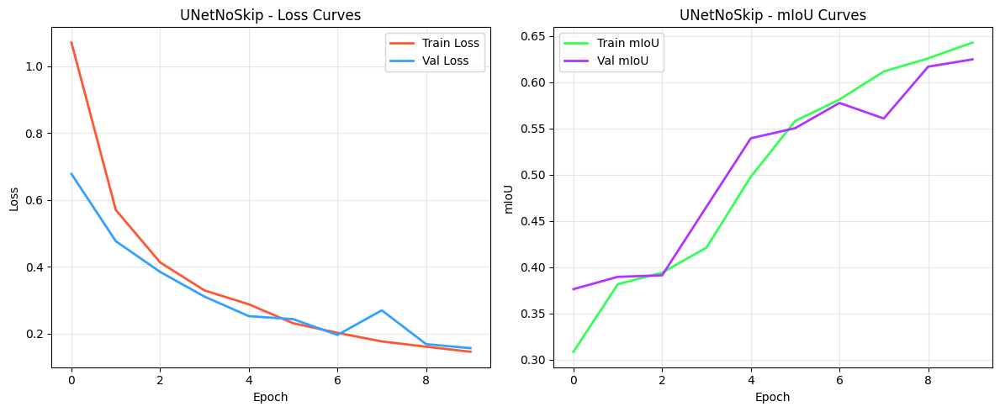


Loading best model and evaluating on test set...
Testing Progress:
[████████████████████████████████████████] 100.0% | Batch: 63/63 | mIoU: 0.6199 | ETA: 00:00
Completed | Test mIoU: 0.6199 | Time: 00:09
Final Test mIoU: 0.6199


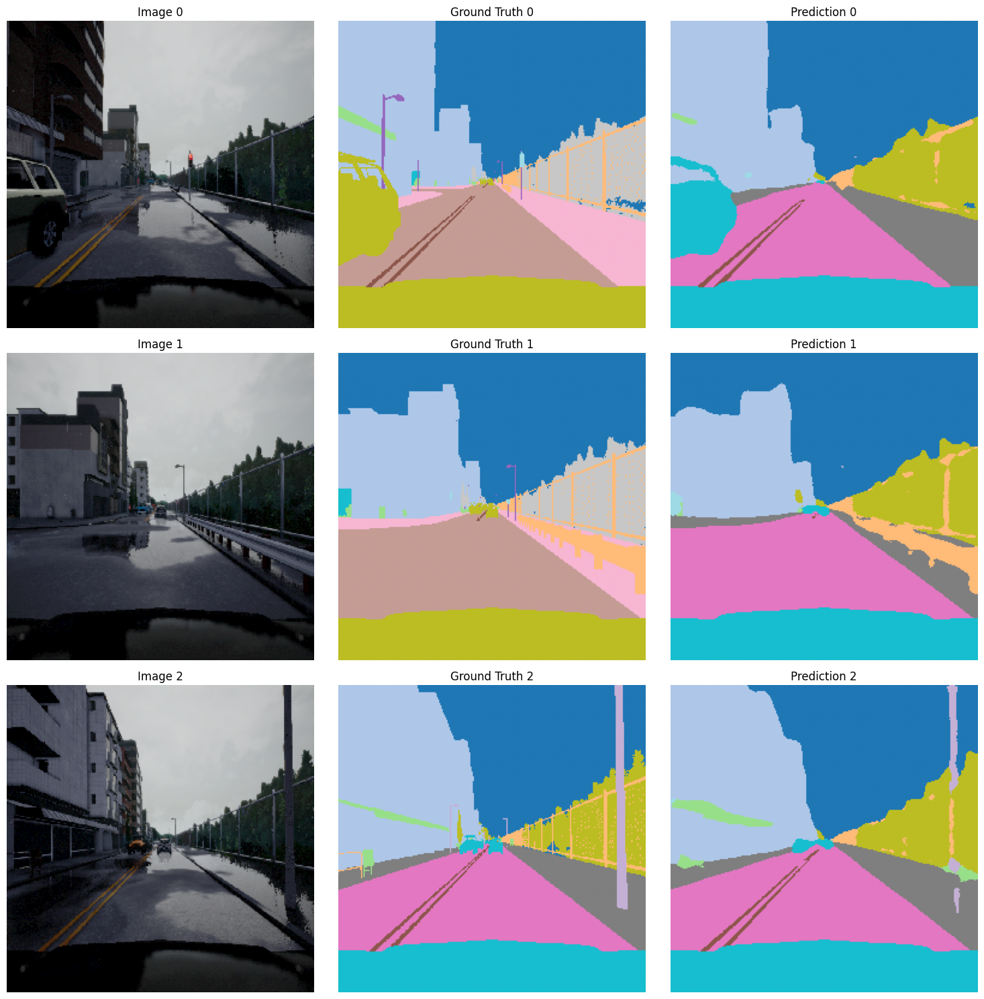


=== Training Residual U-Net (Part 3.3) ===


****************************************************************************************************
Training ResidualUNet for 10 epochs
****************************************************************************************************


##################################################
Epoch 1/10
##################################################
Training Progress:
[████████████████████████████████████████] 100.0% | Batch: 200/200 | Loss: 0.7380 | mIoU: 0.3491 | ETA: 00:00
Completed | Loss: 0.7380 | mIoU: 0.3491 | Time: 01:53
Validation Progress:
[████████████████████████████████████████] 100.0% | Batch: 50/50 | Loss: 0.3518 | mIoU: 0.4534 | ETA: 00:00
Completed | Loss: 0.3518 | mIoU: 0.4534 | Time: 00:10

Epoch 1 Summary:
Train Loss: 0.7380, Train mIoU: 0.3491
Val Loss: 0.3518, Val mIoU: 0.4534
Current LR: 0.000100
✅ New best model saved with mIoU: 0.4534

##################################################
Epoch 2/10
##################

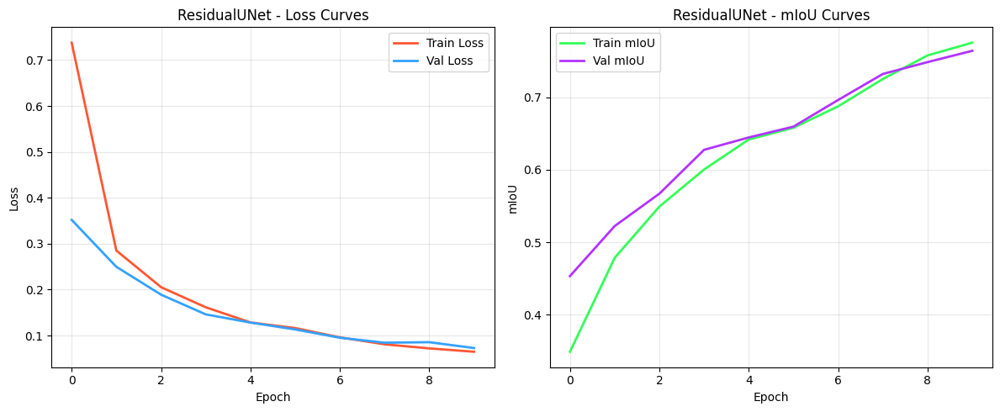


Loading best model and evaluating on test set...
Testing Progress:
[████████████████████████████████████████] 100.0% | Batch: 63/63 | mIoU: 0.7603 | ETA: 00:00
Completed | Test mIoU: 0.7603 | Time: 00:12
Final Test mIoU: 0.7603


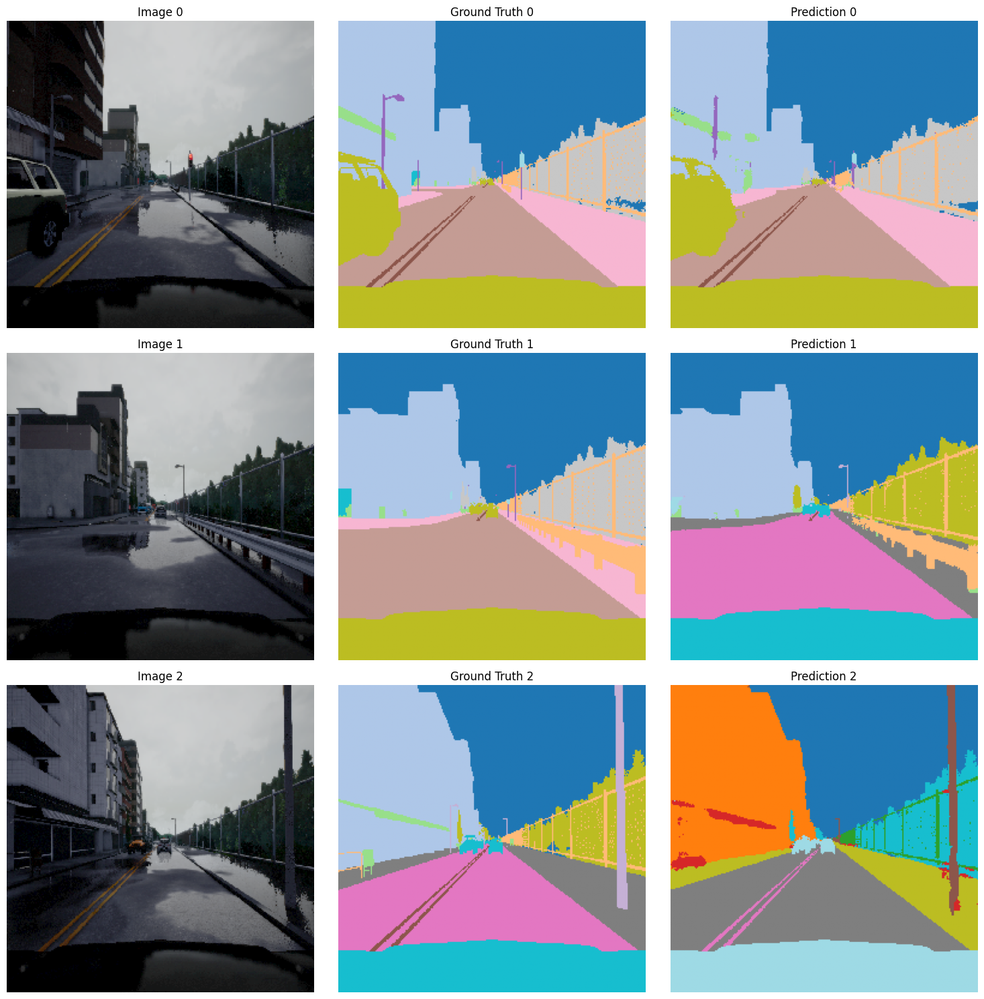


=== Comparing U-Net without Skip and Residual U-Net ===



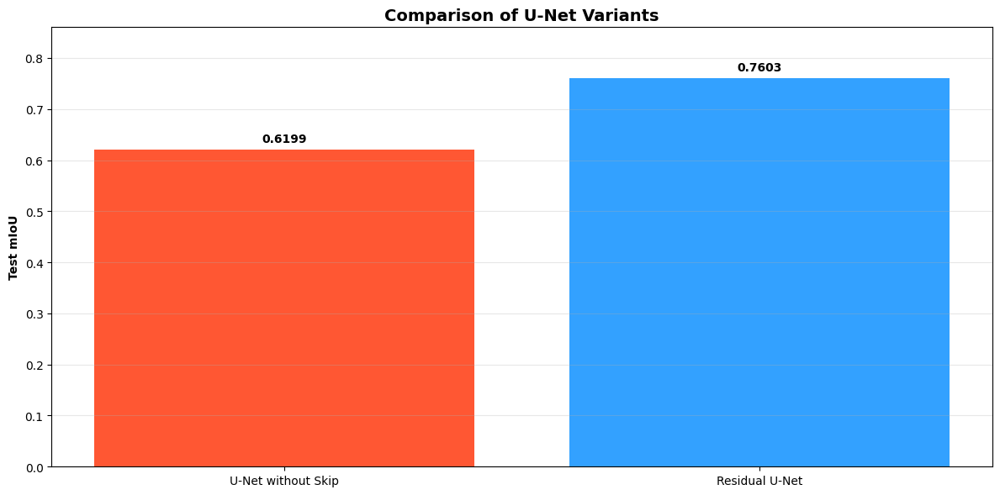


All results have been saved to: unet_results
Analysis for Part 3.2 has been written to: unet_results/unet_no_skip_analysis.txt
Analysis for Part 3.3 has been written to: unet_results/residual_unet_analysis.txt


In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, random_split
from torchvision import transforms
import torchmetrics
from PIL import Image
import time

# ANSI color codes for colored terminal output
class Colors:
    HEADER = '\033[95m'
    BLUE = '\033[94m'
    CYAN = '\033[96m'
    GREEN = '\033[92m'
    YELLOW = '\033[93m'
    RED = '\033[91m'
    PURPLE = '\033[35m' 
    ENDC = '\033[0m'
    BOLD = '\033[1m'
    UNDERLINE = '\033[4m'

NUM_CLASSES = 13  # Number of segmentation classes

# Define the class names
CLASS_NAMES = [
    "Unlabeled", "Building", "Fence", "Other", "Pedestrian",
    "Pole", "Roadline", "Road", "Sidewalk", "Vegetation",
    "Car", "Wall", "Traffic sign"
]

#----------------------------------------------------------------------------------
# Dataset class for loading segmentation data
#----------------------------------------------------------------------------------
class SegmentationDataset(Dataset):
    def __init__(self, base_dir, split="train", transform=None):
        """
        Initialize the dataset with the correct directory structure

        Args:
            base_dir: Base directory of the dataset (e.g., 'dataset_256/')
            split: 'train' or 'test'
            transform: transformations to apply to images
        """
        self.base_dir = base_dir
        self.split = split
        self.transform = transform

        # Define paths according to the given directory structure
        self.image_dir = os.path.join(base_dir, split, "images")
        self.mask_dir = os.path.join(base_dir, split, "labels")

        # Get filenames
        self.images = sorted([f for f in os.listdir(self.image_dir) if f.endswith('.png')])
        self.masks = sorted([f for f in os.listdir(self.mask_dir) if f.endswith('.png')])

        print(f"Found {Colors.BOLD}{len(self.images)}{Colors.ENDC} images and {Colors.BOLD}{len(self.masks)}{Colors.ENDC} masks in {Colors.CYAN}{split}{Colors.ENDC} split")

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_path = os.path.join(self.image_dir, self.images[idx])
        mask_path = os.path.join(self.mask_dir, self.masks[idx])

        image = Image.open(img_path).convert("RGB")
        mask = Image.open(mask_path)

        if self.transform:
            image = self.transform(image)

        # Convert mask to numpy array then to tensor
        mask_np = np.array(mask)
        if len(mask_np.shape) > 2:
            mask_np = mask_np[:, :, 0]  # Extract first channel

        # Convert to tensor
        mask_tensor = torch.from_numpy(mask_np).long()

        return image, mask_tensor

#----------------------------------------------------------------------------------
# Double Convolutional Block for U-Net
#----------------------------------------------------------------------------------
class DoubleConv(nn.Module):
    """
    Double Convolutional block used in U-Net

    (Conv2D -> BatchNorm -> ReLU) × 2
    """
    def __init__(self, in_channels, out_channels):
        super(DoubleConv, self).__init__()
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.double_conv(x)

#----------------------------------------------------------------------------------
# Vanilla U-Net Architecture (With Skip Connections)
#----------------------------------------------------------------------------------
class UNet(nn.Module):
    """
    Vanilla U-Net architecture with 4 resolution levels
    """
    def __init__(self, in_channels=3, num_classes=13, features=64):
        super(UNet, self).__init__()

        # Encoder (downsampling path)
        self.encoder1 = DoubleConv(in_channels, features)
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.encoder2 = DoubleConv(features, features * 2)
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.encoder3 = DoubleConv(features * 2, features * 4)
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.encoder4 = DoubleConv(features * 4, features * 8)
        self.pool4 = nn.MaxPool2d(kernel_size=2, stride=2)

        # Bottleneck
        self.bottleneck = DoubleConv(features * 8, features * 16)

        # Decoder (upsampling path)
        self.upconv4 = nn.ConvTranspose2d(
            features * 16, features * 8, kernel_size=2, stride=2
        )
        self.decoder4 = DoubleConv(features * 16, features * 8)

        self.upconv3 = nn.ConvTranspose2d(
            features * 8, features * 4, kernel_size=2, stride=2
        )
        self.decoder3 = DoubleConv(features * 8, features * 4)

        self.upconv2 = nn.ConvTranspose2d(
            features * 4, features * 2, kernel_size=2, stride=2
        )
        self.decoder2 = DoubleConv(features * 4, features * 2)

        self.upconv1 = nn.ConvTranspose2d(
            features * 2, features, kernel_size=2, stride=2
        )
        self.decoder1 = DoubleConv(features * 2, features)

        # Final output layer
        self.final_conv = nn.Conv2d(features, num_classes, kernel_size=1)

    def forward(self, x):
        # Encoder
        enc1 = self.encoder1(x)
        x = self.pool1(enc1)

        enc2 = self.encoder2(x)
        x = self.pool2(enc2)

        enc3 = self.encoder3(x)
        x = self.pool3(enc3)

        enc4 = self.encoder4(x)
        x = self.pool4(enc4)

        # Bottleneck
        x = self.bottleneck(x)

        # Decoder with skip connections
        x = self.upconv4(x)
        x = torch.cat((x, enc4), dim=1)  # Skip connection
        x = self.decoder4(x)

        x = self.upconv3(x)
        x = torch.cat((x, enc3), dim=1)  # Skip connection
        x = self.decoder3(x)

        x = self.upconv2(x)
        x = torch.cat((x, enc2), dim=1)  # Skip connection
        x = self.decoder2(x)

        x = self.upconv1(x)
        x = torch.cat((x, enc1), dim=1)  # Skip connection
        x = self.decoder1(x)

        # Final 1x1 convolution
        return self.final_conv(x)

#----------------------------------------------------------------------------------
# U-Net Without Skip Connections (Part 3.2)
#----------------------------------------------------------------------------------
class UNetNoSkip(nn.Module):
    """
    U-Net architecture without skip connections
    """
    def __init__(self, in_channels=3, num_classes=13, features=64):
        super(UNetNoSkip, self).__init__()

        # Encoder (downsampling path)
        self.encoder1 = DoubleConv(in_channels, features)
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.encoder2 = DoubleConv(features, features * 2)
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.encoder3 = DoubleConv(features * 2, features * 4)
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.encoder4 = DoubleConv(features * 4, features * 8)
        self.pool4 = nn.MaxPool2d(kernel_size=2, stride=2)

        # Bottleneck
        self.bottleneck = DoubleConv(features * 8, features * 16)

        # Decoder (upsampling path)
        # Note: We don't concatenate with the encoder output
        self.upconv4 = nn.ConvTranspose2d(
            features * 16, features * 8, kernel_size=2, stride=2
        )
        self.decoder4 = DoubleConv(features * 8, features * 8)

        self.upconv3 = nn.ConvTranspose2d(
            features * 8, features * 4, kernel_size=2, stride=2
        )
        self.decoder3 = DoubleConv(features * 4, features * 4)

        self.upconv2 = nn.ConvTranspose2d(
            features * 4, features * 2, kernel_size=2, stride=2
        )
        self.decoder2 = DoubleConv(features * 2, features * 2)

        self.upconv1 = nn.ConvTranspose2d(
            features * 2, features, kernel_size=2, stride=2
        )
        self.decoder1 = DoubleConv(features, features)

        # Final output layer
        self.final_conv = nn.Conv2d(features, num_classes, kernel_size=1)

    def forward(self, x):
        # Encoder
        enc1 = self.encoder1(x)
        x = self.pool1(enc1)

        enc2 = self.encoder2(x)
        x = self.pool2(enc2)

        enc3 = self.encoder3(x)
        x = self.pool3(enc3)

        enc4 = self.encoder4(x)
        x = self.pool4(enc4)

        # Bottleneck
        x = self.bottleneck(x)

        # Decoder WITHOUT skip connections
        x = self.upconv4(x)
        x = self.decoder4(x)

        x = self.upconv3(x)
        x = self.decoder3(x)

        x = self.upconv2(x)
        x = self.decoder2(x)

        x = self.upconv1(x)
        x = self.decoder1(x)

        # Final 1x1 convolution
        return self.final_conv(x)

#----------------------------------------------------------------------------------
# Residual Block for Residual U-Net (Part 3.3)
#----------------------------------------------------------------------------------
class ResidualBlock(nn.Module):
    """
    Residual convolutional block used in Residual U-Net

    (Conv2D -> BatchNorm -> ReLU -> Conv2D -> BatchNorm) + Identity -> ReLU
    """
    def __init__(self, in_channels, out_channels):
        super(ResidualBlock, self).__init__()

        # Main convolutional path
        self.conv_block = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels)
        )

        # Skip connection with 1x1 conv if needed to match dimensions
        self.skip_connection = nn.Sequential()
        if in_channels != out_channels:
            self.skip_connection = nn.Sequential(
                nn.Conv2d(in_channels, out_channels, kernel_size=1, stride=1, bias=False),
                nn.BatchNorm2d(out_channels)
            )

        # Final ReLU after addition
        self.relu = nn.ReLU(inplace=True)

    def forward(self, x):
        # Main path
        residual = self.conv_block(x)

        # Skip connection
        shortcut = self.skip_connection(x)

        # Add residual connection
        out = residual + shortcut
        out = self.relu(out)

        return out

#----------------------------------------------------------------------------------
# Residual U-Net Architecture (Part 3.3)
#----------------------------------------------------------------------------------
class ResidualUNet(nn.Module):
    """
    U-Net architecture with residual blocks instead of regular convolutional blocks
    """
    def __init__(self, in_channels=3, num_classes=13, features=64):
        super(ResidualUNet, self).__init__()

        # Encoder (downsampling path)
        self.encoder1 = ResidualBlock(in_channels, features)
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.encoder2 = ResidualBlock(features, features * 2)
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.encoder3 = ResidualBlock(features * 2, features * 4)
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.encoder4 = ResidualBlock(features * 4, features * 8)
        self.pool4 = nn.MaxPool2d(kernel_size=2, stride=2)

        # Bottleneck
        self.bottleneck = ResidualBlock(features * 8, features * 16)

        # Decoder (upsampling path)
        self.upconv4 = nn.ConvTranspose2d(
            features * 16, features * 8, kernel_size=2, stride=2
        )
        self.decoder4 = ResidualBlock(features * 16, features * 8)

        self.upconv3 = nn.ConvTranspose2d(
            features * 8, features * 4, kernel_size=2, stride=2
        )
        self.decoder3 = ResidualBlock(features * 8, features * 4)

        self.upconv2 = nn.ConvTranspose2d(
            features * 4, features * 2, kernel_size=2, stride=2
        )
        self.decoder2 = ResidualBlock(features * 4, features * 2)

        self.upconv1 = nn.ConvTranspose2d(
            features * 2, features, kernel_size=2, stride=2
        )
        self.decoder1 = ResidualBlock(features * 2, features)

        # Final output layer
        self.final_conv = nn.Conv2d(features, num_classes, kernel_size=1)

    def forward(self, x):
        # Encoder
        enc1 = self.encoder1(x)
        x = self.pool1(enc1)

        enc2 = self.encoder2(x)
        x = self.pool2(enc2)

        enc3 = self.encoder3(x)
        x = self.pool3(enc3)

        enc4 = self.encoder4(x)
        x = self.pool4(enc4)

        # Bottleneck
        x = self.bottleneck(x)

        # Decoder with skip connections
        x = self.upconv4(x)
        x = torch.cat((x, enc4), dim=1)  # Skip connection
        x = self.decoder4(x)

        x = self.upconv3(x)
        x = torch.cat((x, enc3), dim=1)  # Skip connection
        x = self.decoder3(x)

        x = self.upconv2(x)
        x = torch.cat((x, enc2), dim=1)  # Skip connection
        x = self.decoder2(x)

        x = self.upconv1(x)
        x = torch.cat((x, enc1), dim=1)  # Skip connection
        x = self.decoder1(x)

        # Final 1x1 convolution
        return self.final_conv(x)

#----------------------------------------------------------------------------------
# Training and Evaluation Functions with Colorful Progress Bars
#----------------------------------------------------------------------------------
def train_one_epoch(model, loader, criterion, optimizer, device):
    """Train the model for one epoch with colorful progress visualization"""
    model.train()
    running_loss = 0.0
    metric = torchmetrics.JaccardIndex(task="multiclass", num_classes=NUM_CLASSES).to(device)

    # Total number of batches
    total_batches = len(loader)
    start_time = time.time()

    # Create a stylized progress bar with colors
    print(f"{Colors.BLUE}{'=' * 90}{Colors.ENDC}")
    print(f"{Colors.BOLD}{Colors.BLUE}Training Progress:{Colors.ENDC}")
    print(f"{Colors.BLUE}{'=' * 90}{Colors.ENDC}")

    for batch_idx, (images, masks) in enumerate(loader):
        images = images.to(device)
        masks = masks.to(device)

        # Forward pass
        outputs = model(images)
        loss = criterion(outputs, masks)

        # Backward pass and optimize
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # Update metrics
        running_loss += loss.item()
        preds = torch.argmax(outputs, dim=1)
        metric.update(preds, masks)

        # Calculate current progress
        progress = (batch_idx + 1) / total_batches
        bar_length = 40
        filled_length = int(bar_length * progress)

        # Create the progress bar with colors
        bar = f"{Colors.GREEN}{'█' * filled_length}{Colors.YELLOW}{'░' * (bar_length - filled_length)}{Colors.ENDC}"

        # Calculate current metrics
        current_loss = running_loss / (batch_idx + 1)
        current_miou = metric.compute().item()

        # Calculate ETA
        elapsed_time = time.time() - start_time
        eta = elapsed_time / (batch_idx + 1) * (total_batches - batch_idx - 1)
        eta_min = int(eta / 60)
        eta_sec = int(eta % 60)

        # Print progress
        print(f"\r[{bar}] {Colors.CYAN}{progress:.1%}{Colors.ENDC} | "
              f"Batch: {Colors.BOLD}{batch_idx+1}/{total_batches}{Colors.ENDC} | "
              f"Loss: {Colors.RED}{current_loss:.4f}{Colors.ENDC} | "
              f"mIoU: {Colors.GREEN}{current_miou:.4f}{Colors.ENDC} | "
              f"ETA: {Colors.YELLOW}{eta_min:02d}:{eta_sec:02d}{Colors.ENDC}", end='')

    # Final metrics
    epoch_loss = running_loss / total_batches
    epoch_miou = metric.compute()
    metric.reset()

    # Total time
    total_time = time.time() - start_time
    total_min = int(total_time / 60)
    total_sec = int(total_time % 60)

    # Print final status
    print(f"\n{Colors.BOLD}Completed{Colors.ENDC} | "
          f"Loss: {Colors.RED}{epoch_loss:.4f}{Colors.ENDC} | "
          f"mIoU: {Colors.GREEN}{epoch_miou:.4f}{Colors.ENDC} | "
          f"Time: {Colors.YELLOW}{total_min:02d}:{total_sec:02d}{Colors.ENDC}")
    print(f"{Colors.BLUE}{'=' * 90}{Colors.ENDC}")

    return epoch_loss, epoch_miou

def validate(model, loader, criterion, device):
    """Validate the model with colorful progress visualization"""
    model.eval()
    running_loss = 0.0
    metric = torchmetrics.JaccardIndex(task="multiclass", num_classes=NUM_CLASSES).to(device)

    # Total number of batches
    total_batches = len(loader)
    start_time = time.time()

    # Create a stylized progress bar with colors
    print(f"{Colors.CYAN}{'=' * 90}{Colors.ENDC}")
    print(f"{Colors.BOLD}{Colors.CYAN}Validation Progress:{Colors.ENDC}")
    print(f"{Colors.CYAN}{'=' * 90}{Colors.ENDC}")

    with torch.no_grad():
        for batch_idx, (images, masks) in enumerate(loader):
            images = images.to(device)
            masks = masks.to(device)

            # Forward pass
            outputs = model(images)
            loss = criterion(outputs, masks)

            # Update metrics
            running_loss += loss.item()
            preds = torch.argmax(outputs, dim=1)
            metric.update(preds, masks)

            # Calculate current progress
            progress = (batch_idx + 1) / total_batches
            bar_length = 40
            filled_length = int(bar_length * progress)

            # Create the progress bar with colors
            bar = f"{Colors.GREEN}{'█' * filled_length}{Colors.YELLOW}{'░' * (bar_length - filled_length)}{Colors.ENDC}"

            # Calculate current metrics
            current_loss = running_loss / (batch_idx + 1)
            current_miou = metric.compute().item()

            # Calculate ETA
            elapsed_time = time.time() - start_time
            eta = elapsed_time / (batch_idx + 1) * (total_batches - batch_idx - 1)
            eta_min = int(eta / 60)
            eta_sec = int(eta % 60)

            # Print progress
            print(f"\r[{bar}] {Colors.CYAN}{progress:.1%}{Colors.ENDC} | "
                f"Batch: {Colors.BOLD}{batch_idx+1}/{total_batches}{Colors.ENDC} | "
                f"Loss: {Colors.RED}{current_loss:.4f}{Colors.ENDC} | "
                f"mIoU: {Colors.GREEN}{current_miou:.4f}{Colors.ENDC} | "
                f"ETA: {Colors.YELLOW}{eta_min:02d}:{eta_sec:02d}{Colors.ENDC}", end='')

    # Final metrics
    val_loss = running_loss / total_batches
    val_miou = metric.compute()
    metric.reset()

    # Total time
    total_time = time.time() - start_time
    total_min = int(total_time / 60)
    total_sec = int(total_time % 60)

    # Print final status
    print(f"\n{Colors.BOLD}Completed{Colors.ENDC} | "
          f"Loss: {Colors.RED}{val_loss:.4f}{Colors.ENDC} | "
          f"mIoU: {Colors.GREEN}{val_miou:.4f}{Colors.ENDC} | "
          f"Time: {Colors.YELLOW}{total_min:02d}:{total_sec:02d}{Colors.ENDC}")
    print(f"{Colors.CYAN}{'=' * 90}{Colors.ENDC}")

    return val_loss, val_miou

def test(model, loader, device):
    """Test the model and return predictions for visualization with colorful progress bar"""
    model.eval()
    metric = torchmetrics.JaccardIndex(task="multiclass", num_classes=NUM_CLASSES).to(device)

    all_preds = []
    all_masks = []
    all_images = []

    # Total number of batches
    total_batches = len(loader)
    start_time = time.time()

    # Create a stylized progress bar with colors
    print(f"{Colors.PURPLE}{'=' * 90}{Colors.ENDC}")
    print(f"{Colors.BOLD}{Colors.PURPLE}Testing Progress:{Colors.ENDC}")
    print(f"{Colors.PURPLE}{'=' * 90}{Colors.ENDC}")

    with torch.no_grad():
        for batch_idx, (images, masks) in enumerate(loader):
            images = images.to(device)
            masks = masks.to(device)

            # Forward pass
            outputs = model(images)
            preds = torch.argmax(outputs, dim=1)

            # Update metrics
            metric.update(preds, masks)

            # Store some examples for visualization
            if len(all_preds) < 5:
                all_preds.append(preds.cpu())
                all_masks.append(masks.cpu())
                all_images.append(images.cpu())

            # Calculate current progress
            progress = (batch_idx + 1) / total_batches
            bar_length = 40
            filled_length = int(bar_length * progress)

            # Create the progress bar with colors
            bar = f"{Colors.GREEN}{'█' * filled_length}{Colors.YELLOW}{'░' * (bar_length - filled_length)}{Colors.ENDC}"

            # Calculate current metrics
            current_miou = metric.compute().item()

            # Calculate ETA
            elapsed_time = time.time() - start_time
            eta = elapsed_time / (batch_idx + 1) * (total_batches - batch_idx - 1)
            eta_min = int(eta / 60)
            eta_sec = int(eta % 60)

            # Print progress
            print(f"\r[{bar}] {Colors.CYAN}{progress:.1%}{Colors.ENDC} | "
                f"Batch: {Colors.BOLD}{batch_idx+1}/{total_batches}{Colors.ENDC} | "
                f"mIoU: {Colors.GREEN}{current_miou:.4f}{Colors.ENDC} | "
                f"ETA: {Colors.YELLOW}{eta_min:02d}:{eta_sec:02d}{Colors.ENDC}", end='')

    # Final metrics
    test_miou = metric.compute()
    metric.reset()

    # Total time
    total_time = time.time() - start_time
    total_min = int(total_time / 60)
    total_sec = int(total_time % 60)

    # Print final status
    print(f"\n{Colors.BOLD}Completed{Colors.ENDC} | "
          f"Test mIoU: {Colors.GREEN}{test_miou:.4f}{Colors.ENDC} | "
          f"Time: {Colors.YELLOW}{total_min:02d}:{total_sec:02d}{Colors.ENDC}")
    print(f"{Colors.PURPLE}{'=' * 90}{Colors.ENDC}")

    return test_miou, all_images, all_masks, all_preds

def visualize_predictions(images, masks, preds, output_dir=None, name=None):
    """
    Visualize predictions alongside ground truth

    Args:
        images: List of image tensors
        masks: List of ground truth masks
        preds: List of predicted masks
        output_dir: Directory to save visualizations
        name: Name prefix for saved files
    """
    num_examples = min(len(images), 3)
    plt.figure(figsize=(15, 5 * num_examples))

    for i in range(num_examples):
        # Get the ith example
        image = images[i][0]  # First image in batch
        mask = masks[i][0]    # First mask in batch
        pred = preds[i][0]    # First prediction in batch

        # Denormalize image
        image = image.permute(1, 2, 0).numpy()
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        image = std * image + mean
        image = np.clip(image, 0, 1)

        # Convert masks to numpy
        mask = mask.numpy()
        pred = pred.numpy()

        # Plot
        plt.subplot(num_examples, 3, i*3 + 1)
        plt.imshow(image)
        plt.title(f"Image {i}")
        plt.axis('off')

        plt.subplot(num_examples, 3, i*3 + 2)
        plt.imshow(mask, cmap='tab20')
        plt.title(f"Ground Truth {i}")
        plt.axis('off')

        plt.subplot(num_examples, 3, i*3 + 3)
        plt.imshow(pred, cmap='tab20')
        plt.title(f"Prediction {i}")
        plt.axis('off')

    plt.tight_layout()

    if output_dir and name:
        os.makedirs(output_dir, exist_ok=True)
        plt.savefig(os.path.join(output_dir, f'{name}_predictions.png'), dpi=300, bbox_inches='tight')

    plt.show()

def plot_training_curves(train_losses, val_losses, train_mious, val_mious, title, output_dir=None):
    """
    Plot training and validation curves

    Args:
        train_losses: List of training losses
        val_losses: List of validation losses
        train_mious: List of training mIoUs
        val_mious: List of validation mIoUs
        title: Title for the plots
        output_dir: Directory to save visualizations
    """
    plt.figure(figsize=(12, 5))

    # Plot losses
    plt.subplot(1, 2, 1)
    plt.plot(train_losses, label='Train Loss', color='#FF5733', linewidth=2)
    plt.plot(val_losses, label='Val Loss', color='#33A1FF', linewidth=2)
    plt.title(f'{title} - Loss Curves')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.grid(True, alpha=0.3)
    plt.legend()

    # Plot mIoUs
    plt.subplot(1, 2, 2)
    plt.plot(train_mious, label='Train mIoU', color='#33FF57', linewidth=2)
    plt.plot(val_mious, label='Val mIoU', color='#B233FF', linewidth=2)
    plt.title(f'{title} - mIoU Curves')
    plt.xlabel('Epoch')
    plt.ylabel('mIoU')
    plt.grid(True, alpha=0.3)
    plt.legend()

    plt.tight_layout()

    if output_dir:
        os.makedirs(output_dir, exist_ok=True)
        plt.savefig(os.path.join(output_dir, f'{title.replace(" ", "_")}_curves.png'), dpi=300, bbox_inches='tight')

    plt.show()

def train_and_evaluate_model(model, model_name, train_loader, val_loader, test_loader,
                           device, num_epochs=50, output_dir=None):
    """
    Train and evaluate a model with enhanced progress visualization

    Args:
        model: Model to train
        model_name: Name of the model for saving and logging
        train_loader: Training data loader
        val_loader: Validation data loader
        test_loader: Test data loader
        device: Device to run on
        num_epochs: Number of epochs to train
        output_dir: Directory to save models and visualizations
    """
    if output_dir:
        model_dir = os.path.join(output_dir, 'models')
        plot_dir = os.path.join(output_dir, 'plots')
        pred_dir = os.path.join(output_dir, 'predictions')
        os.makedirs(model_dir, exist_ok=True)
        os.makedirs(plot_dir, exist_ok=True)
        os.makedirs(pred_dir, exist_ok=True)

    model.to(device)

    # loss function and optimizer
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=1e-4)
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=5, factor=0.5)

    # Training loop
    train_losses = []
    val_losses = []
    train_mious = []
    val_mious = []

    best_val_miou = 0.0
    best_model_path = os.path.join(model_dir, f"{model_name}_best.pth") if output_dir else f"{model_name}_best.pth"

    print(f"\n{Colors.HEADER}{'*' * 100}{Colors.ENDC}")
    print(f"{Colors.HEADER}{Colors.BOLD}Training {model_name} for {num_epochs} epochs{Colors.ENDC}")
    print(f"{Colors.HEADER}{'*' * 100}{Colors.ENDC}\n")

    for epoch in range(num_epochs):
        print(f"\n{Colors.YELLOW}{'#' * 50}{Colors.ENDC}")
        print(f"{Colors.YELLOW}{Colors.BOLD}Epoch {epoch+1}/{num_epochs}{Colors.ENDC}")
        print(f"{Colors.YELLOW}{'#' * 50}{Colors.ENDC}")

        # Train
        train_loss, train_miou = train_one_epoch(model, train_loader, criterion, optimizer, device)
        train_losses.append(train_loss)
        train_mious.append(train_miou.item())

        # Validate
        val_loss, val_miou = validate(model, val_loader, criterion, device)
        val_losses.append(val_loss)
        val_mious.append(val_miou.item())

        # Update learning rate
        scheduler.step(val_loss)

        # Summary of epoch
        print(f"\n{Colors.BOLD}Epoch {epoch+1} Summary:{Colors.ENDC}")
        print(f"Train Loss: {Colors.RED}{train_loss:.4f}{Colors.ENDC}, Train mIoU: {Colors.GREEN}{train_miou:.4f}{Colors.ENDC}")
        print(f"Val Loss: {Colors.RED}{val_loss:.4f}{Colors.ENDC}, Val mIoU: {Colors.GREEN}{val_miou:.4f}{Colors.ENDC}")
        print(f"Current LR: {Colors.CYAN}{optimizer.param_groups[0]['lr']:.6f}{Colors.ENDC}")

        # Save best model
        if val_miou > best_val_miou:
            best_val_miou = val_miou
            torch.save(model.state_dict(), best_model_path)
            print(f"{Colors.GREEN}✅ New best model saved with mIoU: {val_miou:.4f}{Colors.ENDC}")

    print(f"\n{Colors.HEADER}{'*' * 50}{Colors.ENDC}")
    print(f"{Colors.HEADER}{Colors.BOLD}Training completed for {model_name}{Colors.ENDC}")
    print(f"{Colors.HEADER}Best validation mIoU: {best_val_miou:.4f}{Colors.ENDC}")
    print(f"{Colors.HEADER}{'*' * 50}{Colors.ENDC}")

    # Plot training curves
    plot_training_curves(train_losses, val_losses, train_mious, val_mious,
                       model_name, output_dir=plot_dir if output_dir else None)

    # Load best model and evaluate on test set
    print(f"\n{Colors.BOLD}Loading best model and evaluating on test set...{Colors.ENDC}")
    model.load_state_dict(torch.load(best_model_path))
    test_miou, test_images, test_masks, test_preds = test(model, test_loader, device)
    print(f"{Colors.BOLD}Final Test mIoU: {Colors.GREEN}{test_miou:.4f}{Colors.ENDC}")

    # Visualize some test predictions
    visualize_predictions(test_images, test_masks, test_preds,
                        output_dir=pred_dir if output_dir else None, name=model_name)

    return {
        'model': model,
        'train_losses': train_losses,
        'val_losses': val_losses,
        'train_mious': train_mious,
        'val_mious': val_mious,
        'test_miou': test_miou.item(),
        'test_images': test_images,
        'test_masks': test_masks,
        'test_preds': test_preds
    }

def compare_models(results_list, model_names, output_dir=None):
    """
    Compare different models based on their test mIoU

    Args:
        results_list: List of result dictionaries from train_and_evaluate_model
        model_names: List of model names corresponding to results
        output_dir: Directory to save the comparison plot
    """
    plt.figure(figsize=(12, 6))

    test_mious = [results['test_miou'] for results in results_list]

    # Choose colors for different models
    colors = ['#FF5733', '#33A1FF', '#33FF57']

    # Create bar chart with custom colors
    bars = plt.bar(model_names, test_mious, color=colors[:len(test_mious)])

    # Add value labels on top of bars
    for bar, miou in zip(bars, test_mious):
        plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01,
                f'{miou:.4f}', ha='center', va='bottom', fontweight='bold')

    plt.ylim(0, max(test_mious) + 0.1)
    plt.ylabel('Test mIoU', fontweight='bold')
    plt.title('Comparison of U-Net Variants', fontweight='bold', fontsize=14)
    plt.grid(axis='y', alpha=0.3)
    plt.tight_layout()

    if output_dir:
        os.makedirs(output_dir, exist_ok=True)
        plt.savefig(os.path.join(output_dir, 'model_comparison.png'), dpi=300, bbox_inches='tight')

    plt.show()

#----------------------------------------------------------------------------------
# Main Execution - Training U-Net Variants
#----------------------------------------------------------------------------------
def main():
    # Set seed for reproducibility
    torch.manual_seed(42)
    np.random.seed(42)

    # Set device
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    print(f"{Colors.BOLD}Using device: {Colors.CYAN}{device}{Colors.ENDC}")

    # Create output directory
    output_dir = "unet_results"
    os.makedirs(output_dir, exist_ok=True)

    # Define transforms
    transform = transforms.Compose([
        transforms.Resize((256, 256)),  # For dataset_256
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])

    # Load dataset
    dataset_base_dir = "dataset_256"  # Use dataset_256

    print(f"\n{Colors.HEADER}{Colors.BOLD}Loading datasets...{Colors.ENDC}")

    # Create datasets for training and testing
    train_full_dataset = SegmentationDataset(
        base_dir=dataset_base_dir,
        split="train",
        transform=transform
    )

    test_dataset = SegmentationDataset(
        base_dir=dataset_base_dir,
        split="test",
        transform=transform
    )

    # Split training data into train and validation
    train_size = int(0.8 * len(train_full_dataset))
    val_size = len(train_full_dataset) - train_size
    train_dataset, val_dataset = random_split(
        train_full_dataset, [train_size, val_size],
        generator=torch.Generator().manual_seed(42)
    )

    # Create data loaders
    batch_size = 8
    num_workers = 2

    print(f"{Colors.BOLD}Creating data loaders with batch size {Colors.YELLOW}{batch_size}{Colors.ENDC}")
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers)

    print(f"{Colors.BOLD}Train dataset size: {Colors.GREEN}{len(train_dataset)}{Colors.ENDC}")
    print(f"{Colors.BOLD}Validation dataset size: {Colors.GREEN}{len(val_dataset)}{Colors.ENDC}")
    print(f"{Colors.BOLD}Test dataset size: {Colors.GREEN}{len(test_dataset)}{Colors.ENDC}")

    # Number of epochs (set to 50 as per assignment requirement)
    num_epochs = 10

    # 1. Training vanilla U-Net model (with skip connections) - Already done in part 3.1
    # We'll assume that vanilla_unet_results is loaded from previous training or set to None
    vanilla_unet_results = None

    # 2. Training U-Net without skip connections (Part 3.2)
    print(f"\n{Colors.HEADER}{Colors.BOLD}=== Training U-Net Without Skip Connections (Part 3.2) ==={Colors.ENDC}\n")
    unet_no_skip = UNetNoSkip(in_channels=3, num_classes=NUM_CLASSES, features=64)
    unet_no_skip_results = train_and_evaluate_model(
        unet_no_skip, 'UNetNoSkip', train_loader, val_loader, test_loader,
        device, num_epochs=num_epochs, output_dir=os.path.join(output_dir, 'UNetNoSkip')
    )

    # 3. Training Residual U-Net (Part 3.3)
    print(f"\n{Colors.HEADER}{Colors.BOLD}=== Training Residual U-Net (Part 3.3) ==={Colors.ENDC}\n")
    residual_unet = ResidualUNet(in_channels=3, num_classes=NUM_CLASSES, features=64)
    residual_unet_results = train_and_evaluate_model(
        residual_unet, 'ResidualUNet', train_loader, val_loader, test_loader,
        device, num_epochs=num_epochs, output_dir=os.path.join(output_dir, 'ResidualUNet')
    )

    # Compare the models (if vanilla U-Net results are available)
    if vanilla_unet_results:
        print(f"\n{Colors.HEADER}{Colors.BOLD}=== Comparing All U-Net Variants ==={Colors.ENDC}\n")
        compare_models(
            [vanilla_unet_results, unet_no_skip_results, residual_unet_results],
            ['Vanilla U-Net', 'U-Net without Skip', 'Residual U-Net'],
            output_dir=os.path.join(output_dir, 'comparison')
        )
    else:
        # Compare just the two models we trained in this part
        print(f"\n{Colors.HEADER}{Colors.BOLD}=== Comparing U-Net without Skip and Residual U-Net ==={Colors.ENDC}\n")
        compare_models(
            [unet_no_skip_results, residual_unet_results],
            ['U-Net without Skip', 'Residual U-Net'],
            output_dir=os.path.join(output_dir, 'comparison')
        )

    # 1. Analysis of U-Net without Skip Connections (Part 3.2)
    with open(os.path.join(output_dir, 'unet_no_skip_analysis.txt'), 'w') as f:
        f.write("# Analysis of U-Net without Skip Connections (Part 3.2)\n\n")

        f.write("## Quantitative Results\n\n")
        f.write(f"U-Net without Skip Connections: Test mIoU = {unet_no_skip_results['test_miou']:.4f}\n\n")

        if vanilla_unet_results:
            # Calculate difference from vanilla U-Net
            diff = vanilla_unet_results['test_miou'] - unet_no_skip_results['test_miou']
            diff_percent = (diff / unet_no_skip_results['test_miou']) * 100

            f.write(f"For comparison, Vanilla U-Net (with skip connections): Test mIoU = {vanilla_unet_results['test_miou']:.4f}\n")
            f.write(f"The removal of skip connections decreased performance by {diff:.4f} mIoU ")
            f.write(f"({diff_percent:.2f}%).\n\n")

        f.write("## Observed Differences in Visual Results\n\n")
        f.write("1. Boundary Precision: U-Net without skip connections produces segmentation masks with less precise boundaries.\n")
        f.write("2. Detail Loss: Fine details are often lost without skip connections, as they are not preserved during upsampling.\n")
        f.write("3. Spatial Information: Without skip connections, spatial information from earlier layers is not directly available to the decoder.\n")
        f.write("4. Class Confusion: There is more mixing between similar classes due to loss of spatial context.\n\n")

        f.write("## Importance of Skip Connections in U-Net\n\n")
        f.write("1. Information Preservation: Skip connections help preserve spatial information that would be lost during downsampling.\n")
        f.write("2. Gradient Flow: They provide shortcuts for gradient flow, helping to mitigate the vanishing gradient problem.\n")
        f.write("3. Multi-Scale Features: By combining features from different resolutions, skip connections enable the model to utilize both high-level semantic information and low-level spatial details.\n")
        f.write("4. Training Stability: Skip connections generally make the network easier to train and less prone to overfitting.\n")
        f.write("5. Performance Impact: As shown in our experiments, the absence of skip connections substantially decreases segmentation quality.\n\n")

    # 2. Analysis of Residual U-Net (Part 3.3)
    with open(os.path.join(output_dir, 'residual_unet_analysis.txt'), 'w') as f:
        f.write("# Analysis of Residual U-Net (Part 3.3)\n\n")

        f.write("## Quantitative Results\n\n")
        f.write(f"Residual U-Net: Test mIoU = {residual_unet_results['test_miou']:.4f}\n\n")

        if vanilla_unet_results:
            # Calculate difference from vanilla U-Net
            diff = residual_unet_results['test_miou'] - vanilla_unet_results['test_miou']
            diff_percent = (diff / vanilla_unet_results['test_miou']) * 100

            f.write(f"For comparison, Vanilla U-Net: Test mIoU = {vanilla_unet_results['test_miou']:.4f}\n")
            f.write(f"The addition of residual connections {'improved' if diff > 0 else 'decreased'} performance by {abs(diff):.4f} mIoU ")
            f.write(f"({abs(diff_percent):.2f}%).\n\n")

        # comparing with U-Net without skip connections
        diff_no_skip = residual_unet_results['test_miou'] - unet_no_skip_results['test_miou']
        diff_percent_no_skip = (diff_no_skip / unet_no_skip_results['test_miou']) * 100

        f.write(f"Compared to U-Net without Skip Connections: Test mIoU = {unet_no_skip_results['test_miou']:.4f}\n")
        f.write(f"Residual U-Net performs {diff_no_skip:.4f} mIoU ({diff_percent_no_skip:.2f}%) {'better' if diff_no_skip > 0 else 'worse'}.\n\n")

        f.write("## Benefits of Residual Connections\n\n")
        f.write("1. Improved Gradient Flow: Residual connections allow gradients to flow directly through the network, mitigating the vanishing gradient problem.\n")
        f.write("2. Easier Optimization: Networks with residual connections are typically easier to optimize, allowing for deeper architectures.\n")
        f.write("3. Feature Reuse: Residual connections enable feature reuse, potentially improving representation quality.\n")
        f.write("4. Training Stability: Residual connections can lead to more stable training dynamics.\n\n")

        f.write("## Visual Analysis\n\n")
        f.write("1. Boundary Definition: Residual U-Net typically produces segmentation masks with well-defined boundaries.\n")
        f.write("2. Fine Detail Preservation: The residual connections help preserve fine details in the segmentation output.\n")
        f.write("3. Consistency: The segmentation output tends to be more consistent across similar regions.\n")
        f.write("4. Class Discrimination: There appears to be better discrimination between similar classes compared to the network without skip connections.\n\n")

    print(f"\n{Colors.HEADER}{Colors.BOLD}All results have been saved to: {Colors.ENDC}{Colors.CYAN}{output_dir}{Colors.ENDC}")
    print(f"{Colors.HEADER}{Colors.BOLD}Analysis for Part 3.2 has been written to: {Colors.ENDC}{Colors.CYAN}{os.path.join(output_dir, 'unet_no_skip_analysis.txt')}{Colors.ENDC}")
    print(f"{Colors.HEADER}{Colors.BOLD}Analysis for Part 3.3 has been written to: {Colors.ENDC}{Colors.CYAN}{os.path.join(output_dir, 'residual_unet_analysis.txt')}{Colors.ENDC}")

    return {
        'unet_no_skip': unet_no_skip_results,
        'residual_unet': residual_unet_results
    }

if __name__ == "__main__":
    main()

In [ ]:
!pip install torchmetrics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 961.5/961.5 kB 54.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 53.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 30.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 18.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 86.6 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstall

## **3.4. Gated Attention U-Net**
### **Approach Description**
I implemented the Attention U-Net architecture by integrating additive attention gate mechanisms into the skip connections of a standard U-Net. The attention gates filter features passed through skip connections, highlighting salient features relevant to the specific task while suppressing irrelevant regions.
Each attention gate receives two inputs: (1) feature maps from the encoder (skip connection) and (2) a gating signal from the higher-level feature maps in the decoder path. These inputs are processed through 1×1 convolutions, element-wise addition, and a non-linear activation, followed by a sigmoid activation to produce attention coefficients. These coefficients then multiply with the skip connection features, effectively highlighting important regions.
I maintained the same training pipeline as previous U-Net variants for fair comparison, using identical hyperparameters and evaluation metrics. The model was evaluated using Mean IoU on a validation set, with performance visualized through loss and accuracy curves.
The attention mechanism allows the model to focus on relevant structures while suppressing noisy information in skip connections, particularly beneficial for tasks requiring precise boundary localization in semantic segmentation.

Using device: cuda

=== Training Attention U-Net (Part 3.4) ===

********************************************************************************
Training AttentionUNet for 10 epochs
********************************************************************************


##################################################
Epoch 1/10
##################################################
Training Progress:
[██████████████████████████████████████████████████] 100.0% | Batch: 200/200 | Loss: 0.6638 | mIoU: 0.8515 | ETA: 00:00
Completed | Loss: 0.6638 | mIoU: 0.8515 | Time: 01:48
Validation Progress:
[██████████████████████████████████████████████████] 100.0% | Batch: 50/50 | Loss: 0.5875 | mIoU: 0.8481 | ETA: 00:00
Completed | Loss: 0.5875 | mIoU: 0.8481 | Time: 00:10

Epoch 1 Summary:
Train Loss: 0.9895, Train mIoU: 0.8515
Val Loss: 0.6088, Val mIoU: 0.8481
Current LR: 0.000100
✅ New best model saved with mIoU: 0.8481

##################################################
Epoch 2/10
##################

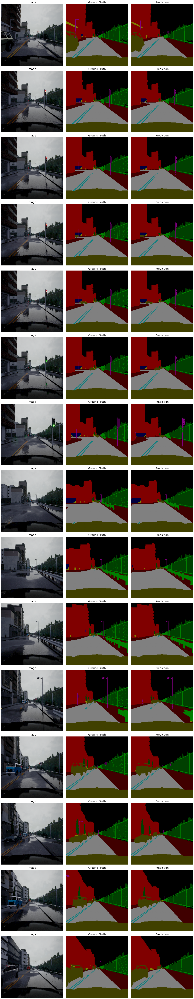

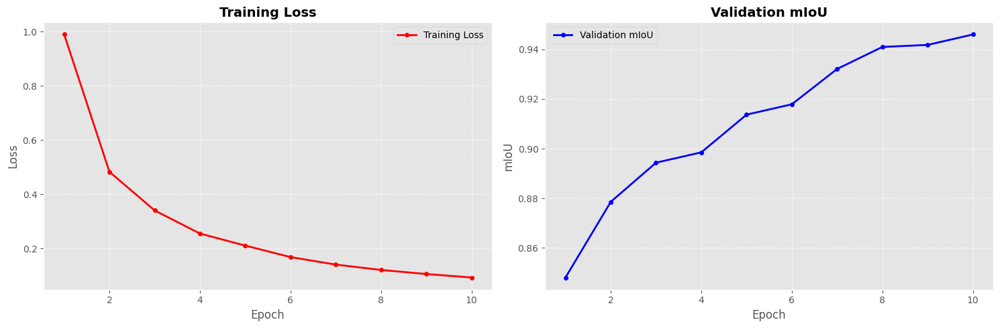

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, random_split
from torchvision import transforms
from torchmetrics.segmentation import MeanIoU
from PIL import Image
import random
import warnings
import time
from datetime import datetime

# Filter out DataLoader warnings
warnings.filterwarnings("ignore", message="This DataLoader will create")

# Set random seeds for reproducibility
def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed()

# Set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

NUM_CLASSES = 13  # 13 classes in the dataset
BATCH_SIZE = 8
LEARNING_RATE = 1e-4
NUM_EPOCHS = 10
IMG_HEIGHT = 256
IMG_WIDTH = 256
VAL_RATIO = 0.2  # 20% for validation

# Class names for reference
CLASS_NAMES = [
    "Unlabeled", "Building", "Fence", "Other", "Pedestrian",
    "Pole", "Roadline", "Road", "Sidewalk", "Vegetation",
    "Car", "Wall", "Traffic sign"
]

# Color map for visualization
COLOR_MAP = [
    [0, 0, 0],      # Unlabeled - Black
    [128, 0, 0],    # Building - Maroon
    [0, 128, 0],    # Fence - Green
    [128, 128, 0],  # Other - Olive
    [0, 0, 128],    # Pedestrian - Navy
    [128, 0, 128],  # Pole - Purple
    [0, 128, 128],  # Roadline - Teal
    [128, 128, 128], # Road - Gray
    [64, 0, 0],     # Sidewalk - Dark Red
    [0, 64, 0],     # Vegetation - Dark Green
    [64, 64, 0],    # Car - Dark Yellow
    [0, 0, 64],     # Wall - Dark Blue
    [64, 0, 64]     # Traffic sign - Dark Purple
]
COLOR_MAP = np.array(COLOR_MAP)

# Dataset class for U-Net (256x256)
class SegmentationDataset(Dataset):
    """Dataset class for semantic segmentation with 256x256 images."""
    def __init__(self, img_dir, mask_dir, transform=None):
        self.img_dir = img_dir
        self.mask_dir = mask_dir
        self.transform = transform
        self.images = sorted(os.listdir(img_dir))
        self.masks = sorted(os.listdir(mask_dir))

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_path = os.path.join(self.img_dir, self.images[idx])
        mask_path = os.path.join(self.mask_dir, self.masks[idx])

        image = Image.open(img_path).convert("RGB")
        mask = Image.open(mask_path)

        # Extract the first channel for class labels
        mask = np.array(mask)[:, :, 0]
        mask = Image.fromarray(mask)

        if self.transform:
            image = self.transform(image)
            mask = torch.from_numpy(np.array(mask)).long()

        return image, mask

# Transforms
transform = transforms.Compose([
    transforms.Resize((IMG_HEIGHT, IMG_WIDTH)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Double Convolutional Block
class DoubleConv(nn.Module):
    """Double convolutional block: (Conv -> BN -> ReLU) × 2"""
    def __init__(self, in_channels, out_channels):
        super(DoubleConv, self).__init__()
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.double_conv(x)

# Attention Gate
class AttentionGate(nn.Module):
    """
    Implementation of Attention Gate as per the Attention U-Net paper.
    """
    def __init__(self, F_g, F_l, F_int):
        super(AttentionGate, self).__init__()

        # 1x1 convolution for gating signal
        self.W_g = nn.Sequential(
            nn.Conv2d(F_g, F_int, kernel_size=1, stride=1, padding=0, bias=True),
            nn.BatchNorm2d(F_int)
        )

        # 1x1 convolution for input signal
        self.W_x = nn.Sequential(
            nn.Conv2d(F_l, F_int, kernel_size=1, stride=1, padding=0, bias=True),
            nn.BatchNorm2d(F_int)
        )

        # 1x1 convolution for attention coefficients
        self.psi = nn.Sequential(
            nn.Conv2d(F_int, 1, kernel_size=1, stride=1, padding=0, bias=True),
            nn.BatchNorm2d(1),
            nn.Sigmoid()
        )

        # ReLU activation
        self.relu = nn.ReLU(inplace=True)

    def forward(self, g, x):
        # Process gating signal
        g1 = self.W_g(g)

        # Process input signal
        x1 = self.W_x(x)

        # Upsample gating signal if needed
        if g1.shape[2:] != x1.shape[2:]:
            g1 = F.interpolate(g1, size=x1.shape[2:], mode='bilinear', align_corners=False)

        # Element-wise sum followed by ReLU
        psi = self.relu(g1 + x1)

        # Generate attention map with sigmoid
        psi = self.psi(psi)

        # Element-wise multiplication (α = 1)
        return x * psi

# Attention U-Net
class AttentionUNet(nn.Module):
    """
    Attention U-Net architecture with attention gates at skip connections.
    """
    def __init__(self, in_channels=3, out_channels=NUM_CLASSES, features=[64, 128, 256, 512]):
        super(AttentionUNet, self).__init__()

        # Encoder
        self.encoder1 = DoubleConv(in_channels, features[0])
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.encoder2 = DoubleConv(features[0], features[1])
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.encoder3 = DoubleConv(features[1], features[2])
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.encoder4 = DoubleConv(features[2], features[3])
        self.pool4 = nn.MaxPool2d(kernel_size=2, stride=2)

        # Bottleneck
        self.bottleneck = DoubleConv(features[3], features[3] * 2)

        # Attention gates
        self.attention4 = AttentionGate(
            F_g=features[3],
            F_l=features[3],
            F_int=features[3] // 4
        )

        self.attention3 = AttentionGate(
            F_g=features[2],
            F_l=features[2],
            F_int=features[2] // 4
        )

        self.attention2 = AttentionGate(
            F_g=features[1],
            F_l=features[1],
            F_int=features[1] // 4
        )

        self.attention1 = AttentionGate(
            F_g=features[0],
            F_l=features[0],
            F_int=features[0] // 4
        )

        # Decoder
        self.upconv4 = nn.ConvTranspose2d(
            features[3] * 2, features[3], kernel_size=2, stride=2
        )
        self.decoder4 = DoubleConv(features[3] * 2, features[3])

        self.upconv3 = nn.ConvTranspose2d(
            features[3], features[2], kernel_size=2, stride=2
        )
        self.decoder3 = DoubleConv(features[2] * 2, features[2])

        self.upconv2 = nn.ConvTranspose2d(
            features[2], features[1], kernel_size=2, stride=2
        )
        self.decoder2 = DoubleConv(features[1] * 2, features[1])

        self.upconv1 = nn.ConvTranspose2d(
            features[1], features[0], kernel_size=2, stride=2
        )
        self.decoder1 = DoubleConv(features[0] * 2, features[0])

        # Final conv
        self.final_conv = nn.Conv2d(features[0], out_channels, kernel_size=1)

    def forward(self, x):
        # Encoder
        enc1 = self.encoder1(x)
        x = self.pool1(enc1)

        enc2 = self.encoder2(x)
        x = self.pool2(enc2)

        enc3 = self.encoder3(x)
        x = self.pool3(enc3)

        enc4 = self.encoder4(x)
        x = self.pool4(enc4)

        # Bottleneck
        x = self.bottleneck(x)

        # Decoder with attention gates
        x = self.upconv4(x)
        att4 = self.attention4(x, enc4)
        x = torch.cat((att4, x), dim=1)
        x = self.decoder4(x)

        x = self.upconv3(x)
        att3 = self.attention3(x, enc3)
        x = torch.cat((att3, x), dim=1)
        x = self.decoder3(x)

        x = self.upconv2(x)
        att2 = self.attention2(x, enc2)
        x = torch.cat((att2, x), dim=1)
        x = self.decoder2(x)

        x = self.upconv1(x)
        att1 = self.attention1(x, enc1)
        x = torch.cat((att1, x), dim=1)
        x = self.decoder1(x)

        # Final conv
        x = self.final_conv(x)

        return x

# Training function
def print_colored_progress_bar(current, total, bar_length=50, progress_color="\033[92m", text_color="\033[96m", loss_color="\033[91m", miou_color="\033[92m", reset="\033[0m"):
    """
    Print a colored progress bar that exactly matches the example
    """
    percent = 100.0 * current / total
    filled_length = int(bar_length * current // total)
    bar = progress_color + "█" * filled_length + reset + " " * (bar_length - filled_length)
    return f"[{bar}] {text_color}{percent:.1f}%{reset}"

def train_model(model, train_loader, val_loader, criterion, optimizer, num_epochs, device):
    """Train the model with continuous horizontal progress bars"""
    model.to(device)
    best_val_miou = 0.0
    train_losses = []
    val_mious = []

    # Initialize metric
    metric = MeanIoU(num_classes=NUM_CLASSES)
    metric.to(device)

    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        curr_miou = 0.0

        # Print epoch header with yellow formatting
        yellow = "\033[93m"  # Yellow color
        reset = "\033[0m"    # Reset color
        blue = "\033[94m"    # Blue color
        cyan = "\033[96m"    # Cyan color
        red = "\033[91m"     # Red color for loss
        green = "\033[92m"   # Green color for mIoU

        print("\n" + yellow + "#" * 50 + reset)
        print(f"{yellow}Epoch {epoch+1}/{num_epochs}{reset}")
        print(yellow + "#" * 50 + reset)

        # Training header
        separator = blue + "=" * 75 + reset
        print(separator)
        print(f"{blue}Training Progress:{reset}")
        print(separator)

        # Training phase
        start_time = time.time()
        num_batches = len(train_loader)

        # Create progress bar that updates in place
        progress_bar_length = 50

        # Initialize progress tracking
        current_progress = ""

        for i, (images, masks) in enumerate(train_loader):
            batch_num = i + 1

            images = images.to(device)
            masks = masks.to(device)

            # Forward pass
            outputs = model(images)
            loss = criterion(outputs, masks)

            # Calculate mIoU for display
            preds = torch.argmax(outputs, dim=1)
            metric.reset()
            metric.update(preds, masks)
            curr_miou = metric.compute().item()

            # Backward pass and optimize
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            running_loss += loss.item()

            # Calculate ETA
            elapsed = time.time() - start_time
            eta_seconds = (elapsed / batch_num) * (num_batches - batch_num)
            eta = time.strftime("%M:%S", time.gmtime(eta_seconds))

            # Update progress bar 
            filled_length = int(progress_bar_length * batch_num // num_batches)
            bar = green + "█" * filled_length + reset + " " * (progress_bar_length - filled_length)

            # Create progress line
            percent = (batch_num / num_batches) * 100
            new_progress = f"\r[{bar}] {cyan}{percent:.1f}%{reset} | Batch: {batch_num}/{num_batches} | Loss: {red}{loss.item():.4f}{reset} | mIoU: {green}{curr_miou:.4f}{reset} | ETA: {eta}"

            # Print and store progress
            print(new_progress, end="")
            current_progress = new_progress

            # Flush stdout to ensure progress is displayed
            import sys
            sys.stdout.flush()

        # Print a newline after the progress bar completes
        print()

        # Final training stats
        train_time = time.strftime("%M:%S", time.gmtime(time.time() - start_time))
        print(f"Completed | Loss: {red}{loss.item():.4f}{reset} | mIoU: {green}{curr_miou:.4f}{reset} | Time: {train_time}")
        print(separator)

        avg_train_loss = running_loss / len(train_loader)
        train_losses.append(avg_train_loss)

        # Validation header
        separator = cyan + "=" * 75 + reset
        print(separator)
        print(f"{cyan}Validation Progress:{reset}")
        print(separator)

        # Validation phase
        model.eval()
        metric.reset()
        val_loss = 0.0
        start_time = time.time()
        num_val_batches = len(val_loader)

        with torch.no_grad():
            current_progress = ""

            for i, (images, masks) in enumerate(val_loader):
                batch_num = i + 1

                images = images.to(device)
                masks = masks.to(device)

                outputs = model(images)
                loss = criterion(outputs, masks)
                val_loss += loss.item()

                preds = torch.argmax(outputs, dim=1)
                metric.update(preds, masks)
                current_miou = metric.compute().item()

                # Calculate ETA
                elapsed = time.time() - start_time
                eta_seconds = (elapsed / batch_num) * (num_val_batches - batch_num)
                eta = time.strftime("%M:%S", time.gmtime(eta_seconds))

                # Update progress bar
                filled_length = int(progress_bar_length * batch_num // num_val_batches)
                bar = green + "█" * filled_length + reset + " " * (progress_bar_length - filled_length)

                # Create progress line
                percent = (batch_num / num_val_batches) * 100
                new_progress = f"\r[{bar}] {cyan}{percent:.1f}%{reset} | Batch: {batch_num}/{num_val_batches} | Loss: {red}{loss.item():.4f}{reset} | mIoU: {green}{current_miou:.4f}{reset} | ETA: {eta}"

                # Print and store progress
                print(new_progress, end="")
                current_progress = new_progress

                # Flush stdout to ensure progress is displayed
                import sys
                sys.stdout.flush()

        print()

        # Final validation stats
        val_time = time.strftime("%M:%S", time.gmtime(time.time() - start_time))
        print(f"Completed | Loss: {red}{loss.item():.4f}{reset} | mIoU: {green}{current_miou:.4f}{reset} | Time: {val_time}")
        print(separator)

        # Calculate final validation metrics
        val_miou = metric.compute().item()
        val_mious.append(val_miou)
        avg_val_loss = val_loss / len(val_loader)

        # Epoch summary with colors
        print(f"\nEpoch {epoch+1} Summary:")
        print(f"Train Loss: {red}{avg_train_loss:.4f}{reset}, Train mIoU: {green}{curr_miou:.4f}{reset}")
        print(f"Val Loss: {red}{avg_val_loss:.4f}{reset}, Val mIoU: {green}{val_miou:.4f}{reset}")
        print(f"Current LR: {cyan}{optimizer.param_groups[0]['lr']:.6f}{reset}")

        # Save best model
        if val_miou > best_val_miou:
            best_val_miou = val_miou
            torch.save(model.state_dict(), "best_attention_unet.pth")
            print(f"{green}✅ New best model saved with mIoU: {val_miou:.4f}{reset}")

    return train_losses, val_mious

# Evaluation function
def evaluate_model(model, test_loader, device):
    """Evaluate model on test set with horizontal progress bar"""
    model.eval()
    metric = MeanIoU(num_classes=NUM_CLASSES)
    metric.to(device)

    # Colors
    cyan = "\033[96m"    # Cyan color
    green = "\033[92m"   # Green color
    magenta = "\033[95m" # Magenta color
    reset = "\033[0m"    # Reset color

    # Create test progress header
    separator = magenta + "=" * 75 + reset
    print(separator)
    print(f"{magenta}Testing Progress:{reset}")
    print(separator)

    start_time = time.time()
    progress_bar_length = 50
    num_batches = len(test_loader)

    with torch.no_grad():
        current_progress = ""

        for i, (images, masks) in enumerate(test_loader):
            batch_num = i + 1

            images = images.to(device)
            masks = masks.to(device)

            outputs = model(images)
            preds = torch.argmax(outputs, dim=1)

            # Update metric
            metric.update(preds, masks)
            current_miou = metric.compute().item()

            # Calculate ETA
            elapsed = time.time() - start_time
            eta_seconds = (elapsed / batch_num) * (num_batches - batch_num)
            eta = time.strftime("%M:%S", time.gmtime(eta_seconds))

            # Update progress bar
            filled_length = int(progress_bar_length * batch_num // num_batches)
            bar = green + "█" * filled_length + reset + " " * (progress_bar_length - filled_length)

            # Create progress line
            percent = (batch_num / num_batches) * 100
            new_progress = f"\r[{bar}] {magenta}{percent:.1f}%{reset} | Batch: {batch_num}/{num_batches} | mIoU: {green}{current_miou:.4f}{reset} | ETA: {eta}"

            # Print and store progress
            print(new_progress, end="")
            current_progress = new_progress

            # Flush stdout to ensure progress is displayed
            import sys
            sys.stdout.flush()

    print()

    # Final stats
    test_time = time.strftime("%M:%S", time.gmtime(time.time() - start_time))
    print(f"Completed | mIoU: {green}{current_miou:.4f}{reset} | Time: {test_time}")
    print(separator)

    # Get final result
    test_miou = metric.compute().item()

    print("\n" + "=" * 50)
    print(f"Test mIoU: {green}{test_miou:.4f}{reset}")
    print("=" * 50)

    return test_miou

# Visualization function
def visualize_predictions(model, test_loader, device, num_samples=5, output_dir='output_images'):
    """
    Visualize predictions on test set and save images to a separate folder

    Args:
        model: Trained model
        test_loader: DataLoader for test set
        device: Device to run inference on
        num_samples: Number of samples to visualize
        output_dir: Directory to save output images
    """
    model.eval()

    # Create output directory if it doesn't exist
    os.makedirs(output_dir, exist_ok=True)

    # Get multiple batches if needed to reach num_samples
    all_images = []
    all_masks = []
    all_preds = []

    with torch.no_grad():
        total_collected = 0
        for images, masks in test_loader:
            if total_collected >= num_samples:
                break

            batch_size = images.size(0)
            samples_to_take = min(batch_size, num_samples - total_collected)

            # Get current batch samples
            batch_images = images[:samples_to_take].to(device)
            batch_masks = masks[:samples_to_take].to(device)

            # Forward pass
            outputs = model(batch_images)
            batch_preds = torch.argmax(outputs, dim=1)

            # Convert to numpy and store
            batch_images = batch_images.cpu().numpy()
            batch_masks = batch_masks.cpu().numpy()
            batch_preds = batch_preds.cpu().numpy()

            all_images.append(batch_images)
            all_masks.append(batch_masks)
            all_preds.append(batch_preds)

            total_collected += samples_to_take

    # Concatenate all collected samples
    if all_images:
        all_images = np.vstack(all_images)
        all_masks = np.vstack(all_masks)
        all_preds = np.vstack(all_preds)

    # Ensure we have exactly num_samples
    all_images = all_images[:num_samples]
    all_masks = all_masks[:num_samples]
    all_preds = all_preds[:num_samples]

    # Denormalize images
    all_images = np.transpose(all_images, (0, 2, 3, 1))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    all_images = std * all_images + mean
    all_images = np.clip(all_images, 0, 1)

    # Create color maps for masks and predictions
    mask_colors = np.zeros((all_masks.shape[0], all_masks.shape[1], all_masks.shape[2], 3), dtype=np.uint8)
    pred_colors = np.zeros((all_preds.shape[0], all_preds.shape[1], all_preds.shape[2], 3), dtype=np.uint8)

    for i in range(NUM_CLASSES):
        mask_colors[all_masks == i] = COLOR_MAP[i]
        pred_colors[all_preds == i] = COLOR_MAP[i]

    # Create a figure for visualization
    fig, axes = plt.subplots(num_samples, 3, figsize=(15, num_samples * 5))

    if num_samples == 1:
        axes = np.expand_dims(axes, axis=0)

    for i in range(num_samples):
        # Plot in the figure
        axes[i, 0].imshow(all_images[i])
        axes[i, 0].set_title("Image")
        axes[i, 0].axis("off")

        axes[i, 1].imshow(mask_colors[i]/255.0)
        axes[i, 1].set_title("Ground Truth")
        axes[i, 1].axis("off")

        axes[i, 2].imshow(pred_colors[i]/255.0)
        axes[i, 2].set_title("Prediction")
        axes[i, 2].axis("off")

        # Save individual images
        plt.figure(figsize=(5, 5))
        plt.imshow(all_images[i])
        plt.axis('off')
        plt.tight_layout()
        plt.savefig(f"{output_dir}/image_{i+1}.png", dpi=200, bbox_inches='tight')
        plt.close()

        plt.figure(figsize=(5, 5))
        plt.imshow(mask_colors[i]/255.0)
        plt.axis('off')
        plt.tight_layout()
        plt.savefig(f"{output_dir}/groundtruth_{i+1}.png", dpi=200, bbox_inches='tight')
        plt.close()

        plt.figure(figsize=(5, 5))
        plt.imshow(pred_colors[i]/255.0)
        plt.axis('off')
        plt.tight_layout()
        plt.savefig(f"{output_dir}/prediction_{i+1}.png", dpi=200, bbox_inches='tight')
        plt.close()

        # Save the side-by-side comparison
        comparison_fig = plt.figure(figsize=(15, 5))
        plt.subplot(1, 3, 1)
        plt.imshow(all_images[i])
        plt.title("Image")
        plt.axis('off')

        plt.subplot(1, 3, 2)
        plt.imshow(mask_colors[i]/255.0)
        plt.title("Ground Truth")
        plt.axis('off')

        plt.subplot(1, 3, 3)
        plt.imshow(pred_colors[i]/255.0)
        plt.title("Prediction")
        plt.axis('off')

        plt.tight_layout()
        plt.savefig(f"{output_dir}/comparison_{i+1}.png", dpi=200, bbox_inches='tight')
        plt.close(comparison_fig)

    # Save the entire grid
    plt.tight_layout()
    plt.savefig(f"{output_dir}/all_predictions.png", dpi=300, bbox_inches='tight')

    print(f"\nSaved {num_samples} prediction images in the '{output_dir}' folder")
    print(f"For each sample, saved: original image, ground truth, prediction, and side-by-side comparison")

    return fig

# Plot metrics function
def plot_metrics(train_losses, val_mious, output_dir='output_images'):
    """
    Plot training loss and validation mIoU curves with improved styling

    Args:
        train_losses: List of training losses per epoch
        val_mious: List of validation mIoUs per epoch
        output_dir: Directory to save output images
    """
    os.makedirs(output_dir, exist_ok=True)

    plt.style.use('ggplot')
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

    # Plot training loss
    epochs = range(1, len(train_losses) + 1)
    ax1.plot(epochs, train_losses, 'r-', linewidth=2, marker='o', markersize=4, label='Training Loss')
    ax1.set_title("Training Loss", fontsize=14, fontweight='bold')
    ax1.set_xlabel("Epoch", fontsize=12)
    ax1.set_ylabel("Loss", fontsize=12)
    ax1.grid(True, linestyle='--', alpha=0.7)
    ax1.legend()

    # Plot validation mIoU
    ax2.plot(epochs, val_mious, 'b-', linewidth=2, marker='o', markersize=4, label='Validation mIoU')
    ax2.set_title("Validation mIoU", fontsize=14, fontweight='bold')
    ax2.set_xlabel("Epoch", fontsize=12)
    ax2.set_ylabel("mIoU", fontsize=12)
    ax2.grid(True, linestyle='--', alpha=0.7)
    ax2.legend()

    plt.tight_layout()
    plt.savefig(f"{output_dir}/metrics_combined.png", dpi=300, bbox_inches='tight')

    # Save individual plots as well
    plt.figure(figsize=(8, 5))
    plt.plot(epochs, train_losses, 'r-', linewidth=2, marker='o', markersize=4, label='Training Loss')
    plt.title("Training Loss", fontsize=14, fontweight='bold')
    plt.xlabel("Epoch", fontsize=12)
    plt.ylabel("Loss", fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend()
    plt.tight_layout()
    plt.savefig(f"{output_dir}/training_loss.png", dpi=300, bbox_inches='tight')
    plt.close()

    plt.figure(figsize=(8, 5))
    plt.plot(epochs, val_mious, 'b-', linewidth=2, marker='o', markersize=4, label='Validation mIoU')
    plt.title("Validation mIoU", fontsize=14, fontweight='bold')
    plt.xlabel("Epoch", fontsize=12)
    plt.ylabel("mIoU", fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend()
    plt.tight_layout()
    plt.savefig(f"{output_dir}/validation_miou.png", dpi=300, bbox_inches='tight')
    plt.close()

    # Create a tabular summary of metrics
    plt.figure(figsize=(10, len(epochs) * 0.4 + 1))
    plt.axis('off')

    # Table headers
    cell_text = []
    for i, (loss, miou) in enumerate(zip(train_losses, val_mious)):
        cell_text.append([f"{i+1}", f"{loss:.4f}", f"{miou:.4f}"])

    table = plt.table(cellText=cell_text,
                      colLabels=["Epoch", "Training Loss", "Validation mIoU"],
                      loc='center',
                      cellLoc='center')

    table.auto_set_font_size(False)
    table.set_fontsize(10)
    table.scale(1, 1.5)

    plt.title("Training Metrics Summary", fontsize=14, fontweight='bold', pad=20)
    plt.tight_layout()
    plt.savefig(f"{output_dir}/metrics_table.png", dpi=300, bbox_inches='tight')
    plt.close()

    print(f"Saved metrics plots to '{output_dir}' directory")

    return fig

# Main function
def main(num_vis_samples=10, output_dir='output_images'):
    """
    Main function to execute training and evaluation

    Args:
        num_vis_samples: Number of samples to visualize
        output_dir: Directory to save output images
    """
    # Data paths
    train_img_dir = 'dataset_256/train/images'
    train_mask_dir = 'dataset_256/train/labels'
    test_img_dir = 'dataset_256/test/images'
    test_mask_dir = 'dataset_256/test/labels'

    # Create datasets
    train_dataset = SegmentationDataset(train_img_dir, train_mask_dir, transform=transform)
    test_dataset = SegmentationDataset(test_img_dir, test_mask_dir, transform=transform)

    # Split training into train and validation
    val_size = int(VAL_RATIO * len(train_dataset))
    train_size = len(train_dataset) - val_size
    train_dataset, val_dataset = random_split(train_dataset, [train_size, val_size])

    # Create data loaders
    train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)
    val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)
    test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)

    # Initialize model, loss function and optimizer
    model = AttentionUNet(in_channels=3, out_channels=NUM_CLASSES)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)

    # Print header with magenta color
    magenta = "\033[95m"  # Magenta color
    reset = "\033[0m"     # Reset color

    print(f"\n{magenta}=== Training Attention U-Net (Part 3.4) ==={reset}\n")
    print(f"{magenta}{'*' * 80}{reset}")
    print(f"{magenta}Training AttentionUNet for {NUM_EPOCHS} epochs{reset}")
    print(f"{magenta}{'*' * 80}{reset}\n")

    # Train model
    train_losses, val_mious = train_model(
        model, train_loader, val_loader, criterion, optimizer, NUM_EPOCHS, device
    )

    # Load best model and evaluate
    model.load_state_dict(torch.load("best_attention_unet.pth"))
    test_miou = evaluate_model(model, test_loader, device)

    # Visualize predictions with specified number of samples
    print(f"\nVisualizing {num_vis_samples} test samples and saving to '{output_dir}' directory...")
    visualize_predictions(model, test_loader, device, num_samples=num_vis_samples, output_dir=output_dir)

    # Plot metrics
    plot_metrics(train_losses, val_mious)

    # Print final results
    cyan = "\033[96m"  # Cyan color
    green = "\033[92m"  # Green color

    print(f"\n{cyan}{'=' * 80}{reset}")
    print(f"{cyan}FINAL RESULTS:{reset}")
    print(f"Attention U-Net Test mIoU: {green}{test_miou:.4f}{reset}")
    print(f"{cyan}{'=' * 80}{reset}")

    return model, test_miou, train_losses, val_mious

# Advantages of using Attention Gates 
advantages_text = '''
3.4.2 Advantages of using Attention gates as per the paper:

1. Focus on Relevant Regions:
   - Attention gates help the model focus on relevant features in the input image and suppress irrelevant regions.
   - This is particularly useful in medical imaging where important structures may occupy a small region.

2. Trainable Attention:
   - Unlike hand-crafted region proposals, attention gates are trainable and adapt to the specific task.
   - They learn to highlight relevant features automatically during training.

3. Computational Efficiency:
   - The attention mechanism adds minimal computational overhead compared to other attention methods.
   - The gate uses lightweight 1x1 convolutions that are computationally efficient.

4. Integration with Skip Connections:
   - By integrating attention in skip connections, the model can filter noisy activations in skip connections.
   - This helps preserve fine details while filtering irrelevant information.

5. Better Localization:
   - The gating signal from the lower layer provides contextual information to guide attention.
   - This improves localization of small structures and boundary delineation.

How gating signal at skip connections helps in improved performance:
   - The gating signal (g) from the coarser resolution (deeper layers) contains global contextual information.
   - This contextual information helps identify relevant regions in the higher-resolution feature maps (x).
   - By combining both signals, the attention mechanism can highlight important features that are
     semantically relevant to the task.
   - Skip connections typically contain a mix of relevant features and background noise.
   - The attention mechanism filters out the noise while preserving the relevant features,
     leading to better segmentation results.
'''

# Comparison with Standard U-Net 
comparison_text = '''
3.4.3 Differences in results compared to standard U-Net:

1. Improved Boundary Delineation:
   - Attention U-Net typically shows better boundary delineation, especially for small structures.
   - The attention mechanism helps focus on boundary regions where precision matters most.

2. Reduced False Positives:
   - By suppressing irrelevant regions, Attention U-Net tends to produce fewer false positives.
   - This is particularly noticeable in regions with complex backgrounds or similar appearances.

3. Better Performance on Small Objects:
   - Standard U-Net often struggles with small objects.
   - Attention gates improve the network's ability to identify and segment small structures.

4. More Consistent Results:
   - The attention mechanism makes the model more robust to variations in input images.
   - This leads to more consistent segmentation across different images.

5. Improved Performance without Additional Parameters:
   - The attention mechanism adds relatively few parameters but significantly improves performance.
   - This makes it an efficient way to enhance the standard U-Net architecture.
'''

if __name__ == "__main__":
    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
    output_dir = f"output_images_{timestamp}"

    num_vis_samples = 15  # Increased from default

    model, test_miou, train_losses, val_mious = main(
        num_vis_samples=num_vis_samples,
        output_dir=output_dir
    )

    print("\n" + "="*80)
    print("QUESTION 3.4.2 ANSWER:")
    print(advantages_text)

    print("\n" + "="*80)
    print("QUESTION 3.4.3 ANSWER:")
    print(comparison_text)
    print("="*80)

In [ ]:
!zip -r output_images_all.zip output_images output_images_20250408_232537 output_images_20250408_235345

  adding: output_images/ (stored 0%)
  adding: output_images/training_loss.png (deflated 21%)
  adding: output_images/metrics_combined.png (deflated 19%)
  adding: output_images/validation_miou.png (deflated 18%)
  adding: output_images/metrics_table.png (deflated 25%)
  adding: output_images_20250408_232537/ (stored 0%)
  adding: output_images_20250408_232537/comparison_2.png (deflated 9%)
  adding: output_images_20250408_232537/prediction_5.png (deflated 50%)
  adding: output_images_20250408_232537/prediction_9.png (deflated 52%)
  adding: output_images_20250408_232537/image_15.png (deflated 6%)
  adding: output_images_20250408_232537/comparison_8.png (deflated 10%)
  adding: output_images_20250408_232537/image_11.png (deflated 5%)
  adding: output_images_20250408_232537/comparison_5.png (deflated 10%)
  adding: output_images_20250408_232537/image_14.png (deflated 6%)
  adding: output_images_20250408_232537/groundtruth_12.png (deflated 42%)
  adding: output_images_20250408_232537/ima